# European hotel reservation demand data set EDA

- **Group Name: NO ERROR**
- **Group Leader: XIE YuXiang**
- **Group members: CHIU Sing Yuk, HUANG Zefei, LUO Yifeng**

## Task Assignment
- **Data cleaning: LUO Yifeng**
- **Data search: HUANG Zefei,XIE Yuxiang,LUO Yifeng,CHIU Sing Yuk**
- **Data visualization: LUO Yifeng,CHIU Sing Yuk,XIE Yuxiang,HUANG Zefei**
- **Copywriting:XIE Yuxiang,LUO Yifeng**

# 1.Project Introduction

## 1.1 The data was from 

- article `"Hotel Reservation Demand Data Set"` written by Nuno Antonio, Ana Almeida and Luis Nunes, for data introduction, Volume 22, February 2019. 

## 1.2 What is this data set about?

This data set collected hotel reservation data from 2015 to 2017 at **a city hotel** and **a resort hotel** in Lisbon, Portugal, and includes information such as `when the booking was made`, `length of stay`, `the number of adults`, `children`, and/or `babies`, and `the number of available parking spaces`, among `other things`.The data is total 11930. **All personally identifying information has been removed from the data**.

## 1.3 The Target
**1.3.1 Complete the data preprocessing of the data set;**

**1.3.2 Use the data set to analyze the consumption behavior of hotel types and customer groups;**

**1.3.3 Establish a machine learning model based on the data set to predict the factors that affect the hotel occupancy rate.**

## 1.4 The problems that can be identify
**1.4.1 Where do the guests come from?**

**1.4.2 How much does a guest pay for a room per night?**

**1.4.3 How long does the guest stay in the hotel?**

**1.4.4 Which room types are booked the most?**

**1.4.5 Which customer types are booked the most?**

**1.4.6 Which month has the most cancellations and most booking??**

**1.4.7 How does the price per night change during the years?**

# 2.Import data

##  2.1 Import the packages

In [33]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

- **In this project, some plots were made by plotly**
- **This is the step to install plotly package**

In [34]:
import sys
!{sys.executable} -m pip install plotly

## 2.2 Import the plotly package 

In [35]:
import plotly.graph_objs as go
import plotly.express as px

In [36]:
#settings
pd.set_option('max_columns',1000)
pd.set_option('max_row',5000)
pd.set_option('display.float_format', lambda x: '%.5f' % x)

In [37]:
path = '../data/hotel_bookings.csv'
df = pd.read_csv(path)
#df.head()

## 2.3 Examining the attributes of the Data Frame (standard procedures)

- ```df.shape``` ("dim" in R) 
- ```df.columns``` (check the variables, like "names" in R) 
- ```df.index``` (check the index of the "rows") 
- ```df.info()```
- ```df.describe()``` (descriptive statistics for numerical variables)  

In [38]:
#The data column description is as follows.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

## 2.4 The data columns mainly contains the following 3 aspects of information.
**2.4.1 Customer information:
Customer information, Arrival time**

**2.4.2 Room information:
Room type, Room price**

**2.4.3. Order information:
Booking time, Booking status** 

In [39]:
df.shape

(119390, 32)

In [40]:
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [41]:
df2 = df.copy()

In [42]:
df2 = df2[['hotel', 'is_canceled', 'arrival_date_year', 'arrival_date_month', 
         'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 
         'adults', 'children', 'babies', 'country', 'assigned_room_type', 'adr']]
df2.head()

,hotel,is_canceled,arrival_date_year,arrival_date_month,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,assigned_room_type,adr
0,Resort Hotel,0,2015,July,1,0,0,2,0.00000,0,PRT,C,0.00000
1,Resort Hotel,0,2015,July,1,0,0,2,0.00000,0,PRT,C,0.00000
2,Resort Hotel,0,2015,July,1,0,1,1,0.00000,0,GBR,C,75.00000
3,Resort Hotel,0,2015,July,1,0,1,1,0.00000,0,GBR,A,75.00000
4,Resort Hotel,0,2015,July,1,0,2,2,0.00000,0,GBR,A,98.00000


# 3. Clean the data
- Luo Yifeng

## 3.1 Clean up the unpaid booking information

In [43]:
#df2.head()

In [44]:
## for the people who don't pay , drop them 
no_pay = list(df2.loc[df2['adr']==0].index)
df2.drop(df2.index[no_pay], inplace=True)

In [45]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117431 entries, 2 to 119389
Data columns (total 13 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   hotel                      117431 non-null  object 
 1   is_canceled                117431 non-null  int64  
 2   arrival_date_year          117431 non-null  int64  
 3   arrival_date_month         117431 non-null  object 
 4   arrival_date_day_of_month  117431 non-null  int64  
 5   stays_in_weekend_nights    117431 non-null  int64  
 6   stays_in_week_nights       117431 non-null  int64  
 7   adults                     117431 non-null  int64  
 8   children                   117427 non-null  float64
 9   babies                     117431 non-null  int64  
 10  country                    116964 non-null  object 
 11  assigned_room_type         117431 non-null  object 
 12  adr                        117431 non-null  float64
dtypes: float64(2), int64(7), obje

In [46]:
df2.loc[:, 'arrival_date_month'].value_counts()

August       13711
July         12491
May          11611
April        10953
October      10929
June         10819
September    10351
March         9642
February      7921
November      6641
December      6561
January       5801
Name: arrival_date_month, dtype: int64

In [47]:
month = df2[['arrival_date_month', 'assigned_room_type']]

In [48]:
data = df2.copy()

**Make the data `arrival_date_month`, `arrival_date_day_of_month` and `arrival_date_year` which is the day customer arrival. Make the data into one column and drop `arrival_date_day_of_month` and `arrival_date_year`**

**Also convert `month` and `day` to `number` for math calculation**

In [49]:
# convert month to number 
data.loc[data['arrival_date_month']=='January', 'arrival_date_month'] = '01'
data.loc[data['arrival_date_month']=='February', 'arrival_date_month'] = '02'
data.loc[data['arrival_date_month']=='March', 'arrival_date_month'] = '03'
data.loc[data['arrival_date_month']=='April', 'arrival_date_month'] = '04'
data.loc[data['arrival_date_month']=='May', 'arrival_date_month'] = '05'
data.loc[data['arrival_date_month']=='June', 'arrival_date_month'] = '06'
data.loc[data['arrival_date_month']=='July', 'arrival_date_month'] = '07'
data.loc[data['arrival_date_month']=='August', 'arrival_date_month'] = '08'
data.loc[data['arrival_date_month']=='September', 'arrival_date_month'] = '09'
data.loc[data['arrival_date_month']=='October', 'arrival_date_month'] = '10'
data.loc[data['arrival_date_month']=='November', 'arrival_date_month'] = '11'
data.loc[data['arrival_date_month']=='December', 'arrival_date_month'] = '12'

In [50]:
# convert day format
data.loc[data['arrival_date_day_of_month']== 1, 'arrival_date_day_of_month'] = '01'
data.loc[data['arrival_date_day_of_month']== 2, 'arrival_date_day_of_month'] = '02'
data.loc[data['arrival_date_day_of_month']== 3, 'arrival_date_day_of_month'] = '03'
data.loc[data['arrival_date_day_of_month']== 4, 'arrival_date_day_of_month'] = '04'
data.loc[data['arrival_date_day_of_month']== 5, 'arrival_date_day_of_month'] = '06'
data.loc[data['arrival_date_day_of_month']== 7, 'arrival_date_day_of_month'] = '07'
data.loc[data['arrival_date_day_of_month']== 8, 'arrival_date_day_of_month'] = '08'
data.loc[data['arrival_date_day_of_month']== 9, 'arrival_date_day_of_month'] = '09'

In [51]:
data.insert(data.shape[1], 'd', '/')

In [52]:
data['arrival_date'] = data['arrival_date_day_of_month'].map(str) + data['d'] + data['arrival_date_month'].map(str) + data['d'] + data['arrival_date_year'].map(str)
#data.head()

**Add total `stays_in_weekend_night` and `stays_in_week_nights` into one column stands for `total_stay_days` about the customers**

In [53]:
data['total_stay_days'] = data['stays_in_weekend_nights'] + data['stays_in_week_nights']
#data.head()

In [54]:
data['total_guests'] = data['adults'] + data['children'] + data['babies']

In [55]:
data.drop(['arrival_date_year', 'arrival_date_month', 'arrival_date_day_of_month', 'd'], axis=1, inplace=True)
#data.head()

In [56]:
data['arrival_month'] = month['arrival_date_month']
#data.head()

**convert `arrival_date` to pandas time type**

In [57]:
data['arrival_date'] = pd.to_datetime(data['arrival_date'], infer_datetime_format=True)
data['arrival_date'].head()

2   2015-01-07
3   2015-01-07
4   2015-01-07
5   2015-01-07
6   2015-01-07
Name: arrival_date, dtype: datetime64[ns]

In [58]:
data.head()

,hotel,is_canceled,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,assigned_room_type,adr,arrival_date,total_stay_days,total_guests,arrival_month
2,Resort Hotel,0,0,1,1,0.00000,0,GBR,C,75.00000,2015-01-07,1,1.00000,July
3,Resort Hotel,0,0,1,1,0.00000,0,GBR,A,75.00000,2015-01-07,1,1.00000,July
4,Resort Hotel,0,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July
5,Resort Hotel,0,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July
6,Resort Hotel,0,0,2,2,0.00000,0,PRT,C,107.00000,2015-01-07,2,2.00000,July


## 3.2 Clean up customers who canceled their bookings information

In [59]:
data1 = data.copy()
data1.loc[:, 'is_canceled'].value_counts()

0    73420
1    44011
Name: is_canceled, dtype: int64

In [60]:
# customers who canceled their bookings are not counted
data1 = data1.loc[data['is_canceled']==0]
clean_data = data1.copy()
clean_data.drop('is_canceled', axis=1, inplace=True)
clean_data.head()

,hotel,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,assigned_room_type,adr,arrival_date,total_stay_days,total_guests,arrival_month
2,Resort Hotel,0,1,1,0.00000,0,GBR,C,75.00000,2015-01-07,1,1.00000,July
3,Resort Hotel,0,1,1,0.00000,0,GBR,A,75.00000,2015-01-07,1,1.00000,July
4,Resort Hotel,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July
5,Resort Hotel,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July
6,Resort Hotel,0,2,2,0.00000,0,PRT,C,107.00000,2015-01-07,2,2.00000,July


In [61]:
clean_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73420 entries, 2 to 119389
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   hotel                    73420 non-null  object        
 1   stays_in_weekend_nights  73420 non-null  int64         
 2   stays_in_week_nights     73420 non-null  int64         
 3   adults                   73420 non-null  int64         
 4   children                 73420 non-null  float64       
 5   babies                   73420 non-null  int64         
 6   country                  73010 non-null  object        
 7   assigned_room_type       73420 non-null  object        
 8   adr                      73420 non-null  float64       
 9   arrival_date             73420 non-null  datetime64[ns]
 10  total_stay_days          73420 non-null  int64         
 11  total_guests             73420 non-null  float64       
 12  arrival_month            73420 

In [62]:
# Resort Hotel
rh = clean_data.loc[clean_data['hotel']=='Resort Hotel']
rh.head()

,hotel,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,assigned_room_type,adr,arrival_date,total_stay_days,total_guests,arrival_month
2,Resort Hotel,0,1,1,0.00000,0,GBR,C,75.00000,2015-01-07,1,1.00000,July
3,Resort Hotel,0,1,1,0.00000,0,GBR,A,75.00000,2015-01-07,1,1.00000,July
4,Resort Hotel,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July
5,Resort Hotel,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July
6,Resort Hotel,0,2,2,0.00000,0,PRT,C,107.00000,2015-01-07,2,2.00000,July


In [63]:
# City Hotel
ch = clean_data.loc[clean_data['hotel']=='City Hotel']
ch.head()

,hotel,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,assigned_room_type,adr,arrival_date,total_stay_days,total_guests,arrival_month
40066,City Hotel,0,3,1,0.00000,0,PRT,A,58.67000,2015-02-07,3,1.00000,July
40070,City Hotel,0,2,2,0.00000,0,PRT,A,86.00000,2015-03-07,2,2.00000,July
40071,City Hotel,0,2,2,0.00000,0,PRT,A,43.00000,2015-03-07,2,2.00000,July
40072,City Hotel,0,2,2,0.00000,0,PRT,A,86.00000,2015-03-07,2,2.00000,July
40073,City Hotel,0,2,1,0.00000,0,PRT,A,63.00000,2015-03-07,2,1.00000,July


# 4. Data  analysis and visualization 

## 4.1 Where do the guests come from?
### The relationship between hotel type and customer source.
- Luo YiFeng 

#### In both City hotel and Resort hotel

In [64]:
df = clean_data[['country', 'total_guests']]
df_country = df.groupby('country').sum()
df_country.reset_index(inplace=True)
df_country.sort_values(by=['total_guests'], ascending=False, inplace=True)
df_country.head()

,country,total_guests
125,PRT,35553.00000
57,GBR,19142.00000
54,FRA,17244.00000
50,ESP,13116.00000
42,DEU,11606.00000


In [65]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_country.columns),
                fill_color='lightpink',
                align='left'),
    cells=dict(values=[df_country['country'], df_country['total_guests']],
               fill_color='lightblue',
               align='left'))
])

fig.show()

In [66]:
# ![p1.png](attachment:p1.png)

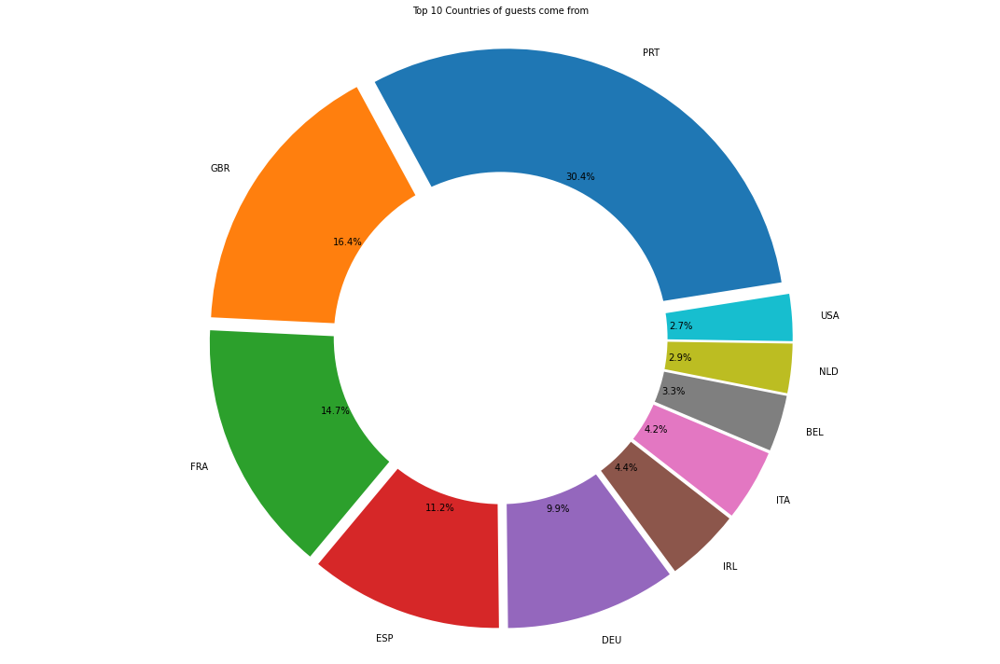

In [67]:
labels = list(df_country['country'].iloc[:10])
sizes = list(df_country['total_guests'].iloc[:10])

explode = []

for i in labels:
    explode.append(0.05)
    
plt.figure(figsize=(15,10))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=9, explode=explode)
centre_circle = plt.Circle((0,0),0.60,fc='white')

fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.title('Top 10 Countries of guests come from', fontsize=10)
plt.axis('equal')
plt.tight_layout()

In [68]:
df_10 = df_country.iloc[:10]

figure = px.bar(df_10, x=df_10['country'], y=df_10['total_guests'], color='country', title='Top 10 Countries of guests come from')
figure.update_layout(plot_bgcolor='rgb(275, 275, 275)',
                    showlegend=False)

figure.data[1].marker.line.width = 3
figure.data[1].marker.line.color = 'black'

figure.show()

In [69]:
# ![p2.png](attachment:p2.png)

In [70]:
# map plot
guest_map = px.choropleth(df_country,
                    locations=df_country['country'],
                    color=df_country['total_guests'], 
                    hover_name=df_country['country'], 
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title="Home country of guests")
guest_map.show()

In [71]:
# ![xx.png](attachment:xx.png)

In [72]:
#Tree plot
df = df_country.copy()
df['Root Node'] = 'The Countries' # in order to have a single root node 
fig = px.treemap(df, path=['Root Node', 'country'], values='total_guests', 
                 color='total_guests', hover_data=['country'],
                 color_continuous_scale='Rainbow')
fig.show()

In [73]:
# ![gg.png](attachment:gg.png)

We used five different maps to show where the guests of city hotels and resort hotels came from. According to the data, we analyze the tourists from the top ten countries with the most bookings as Portugal, the United Kingdom, France, Spain, Germany, Italy, Belgium, the Netherlands and the United States.

#### City hotel

In [74]:
df = ch[['country', 'total_guests']]
df_country = df.groupby('country').sum()
df_country.reset_index(inplace=True)
df_country.sort_values(by=['total_guests'], ascending=False, inplace=True)
df_country.head()

,country,total_guests
113,PRT,17531.00000
48,FRA,14448.00000
37,DEU,9713.00000
51,GBR,7559.00000
44,ESP,6578.00000


In [75]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_country.columns),
                fill_color='lightpink',
                align='left'),
    cells=dict(values=[df_country['country'], df_country['total_guests']],
               fill_color='lightblue',
               align='left'))
])

fig.show()

In [76]:
# ![ff.png](attachment:ff.png)

In [77]:
df_10 = df_country.iloc[:10]

figure = px.bar(df_10, x=df_10['country'], y=df_10['total_guests'], color='country', title='Top 10 Countries of guests come from')
figure.update_layout(plot_bgcolor='rgb(275, 275, 275)',
                    showlegend=False)

figure.data[1].marker.line.width = 3
figure.data[1].marker.line.color = 'black'

figure.show()

In [78]:
#![10.png](attachment:10.png)

In [79]:
# map plot
guest_map = px.choropleth(df_country,
                    locations=df_country['country'],
                    color=df_country['total_guests'], 
                    hover_name=df_country['country'], 
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title="Home country of guests")
guest_map.show()

In [80]:
# ![ma.png](attachment:ma.png)

In [81]:
#Tree plot
df = df_country.copy()
df['Root Node'] = 'The Countries' # in order to have a single root node 
fig = px.treemap(df, path=['Root Node', 'country'], values='total_guests', 
                 color='total_guests', hover_data=['country'],
                 color_continuous_scale='Rainbow')
fig.show()

In [82]:
# ![oo.png](attachment:oo.png)

The plots shows the most guests staying in city hotels are from Portugal, France, Germany, Britain, Spain, Italy, Belgium, the Netherlands, the United States and Brazil.

#### Resort Hotel

In [83]:
df = rh[['country', 'total_guests']]
df_country = df.groupby('country').sum()
df_country.reset_index(inplace=True)
df_country.sort_values(by=['total_guests'], ascending=False, inplace=True)
df_country.head()

,country,total_guests
91,PRT,18022.00000
43,GBR,11583.00000
39,ESP,6538.00000
52,IRL,3486.00000
42,FRA,2796.00000


In [84]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df_country.columns),
                fill_color='lightpink',
                align='left'),
    cells=dict(values=[df_country['country'], df_country['total_guests']],
               fill_color='lightblue',
               align='left'))
])

fig.show()

In [85]:
df_10 = df_country.iloc[:10]

figure = px.bar(df_10, x=df_10['country'], y=df_10['total_guests'], color='country', title='Top 10 Countries of guests come from')
figure.update_layout(plot_bgcolor='rgb(275, 275, 275)',
                    showlegend=False)

figure.data[1].marker.line.width = 3
figure.data[1].marker.line.color = 'black'

figure.show()

In [86]:
# map plot
guest_map = px.choropleth(df_country,
                    locations=df_country['country'],
                    color=df_country['total_guests'], 
                    hover_name=df_country['country'], 
                    color_continuous_scale=px.colors.sequential.Plasma,
                    title="Home country of guests")
guest_map.show()

In [87]:
#Tree plot
df = df_country.copy()
df['Root Node'] = 'The Countries' # in order to have a single root node 
fig = px.treemap(df, path=['Root Node', 'country'], values='total_guests', 
                 color='total_guests', hover_data=['country'],
                 color_continuous_scale='Rainbow')
fig.show()

When it comes to the restore hotel, the resort’s guests come from Portugal, Britain, Spain, Italy, France, Germany, China, the United States, Netherlands and Belgium.

In addition, the largest number of guests staying in city hotels and resort hotels are from Portugal.France and Germany are the most inhabited city hotels. Guests from the UK, Spain and Italy prefer to stay in resorts hotel.

## 3.2 How much does a guest pay for a room per night?
- Huang ZeFei 

In [88]:
clean_data.head()

,hotel,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,assigned_room_type,adr,arrival_date,total_stay_days,total_guests,arrival_month
2,Resort Hotel,0,1,1,0.00000,0,GBR,C,75.00000,2015-01-07,1,1.00000,July
3,Resort Hotel,0,1,1,0.00000,0,GBR,A,75.00000,2015-01-07,1,1.00000,July
4,Resort Hotel,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July
5,Resort Hotel,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July
6,Resort Hotel,0,2,2,0.00000,0,PRT,C,107.00000,2015-01-07,2,2.00000,July


In [89]:
df2 = clean_data

In [90]:
df2['adr'].describe()

count   73420.00000
mean      102.36550
std        47.28032
min        -6.38000
25%        70.00000
50%        94.50000
75%       126.00000
max       510.00000
Name: adr, dtype: float64

In [91]:
df2['total_stay_days'].describe()

count   73420.00000
mean        3.43597
std         2.54249
min         1.00000
25%         2.00000
50%         3.00000
75%         4.00000
max        69.00000
Name: total_stay_days, dtype: float64

In [92]:
df2['total_guests'].describe()

count   73420.00000
mean        1.95282
std         0.66335
min         0.00000
25%         2.00000
50%         2.00000
75%         2.00000
max        12.00000
Name: total_guests, dtype: float64

In [93]:
# clean data: adr<0 or total_guests=0
df2 = df2[df2['adr'] >= 0]
df2 = df2[df2['total_guests'] > 0]

In [94]:
# price_guest_per_night = adr / total_stay_days / total_guests
df2['price_guest_per_night'] = df2['adr']/df2['total_stay_days']/df2['total_guests']
df2['price_guest_per_night'].describe()

count   73388.00000
mean       26.14456
std        24.71405
min         0.00342
25%        10.33333
50%        17.95667
75%        32.66667
max       510.00000
Name: price_guest_per_night, dtype: float64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7facf17ffa30>]],
      dtype=object)

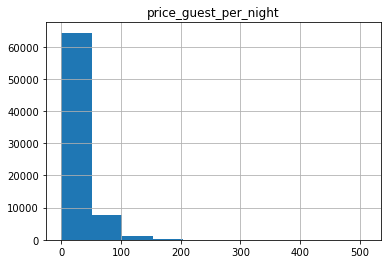

In [95]:
# count
df2.hist('price_guest_per_night')

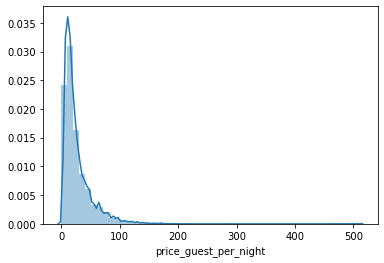

In [96]:
# distribution
sns.distplot(df2['price_guest_per_night'])

Resort hotel

In [97]:
rh.head()

,hotel,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,assigned_room_type,adr,arrival_date,total_stay_days,total_guests,arrival_month
2,Resort Hotel,0,1,1,0.00000,0,GBR,C,75.00000,2015-01-07,1,1.00000,July
3,Resort Hotel,0,1,1,0.00000,0,GBR,A,75.00000,2015-01-07,1,1.00000,July
4,Resort Hotel,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July
5,Resort Hotel,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July
6,Resort Hotel,0,2,2,0.00000,0,PRT,C,107.00000,2015-01-07,2,2.00000,July


In [98]:
# Statistical characteristics
rh['adr'].describe()

count   28271.00000
mean       92.93096
std        58.33457
min        -6.38000
25%        50.00000
50%        74.00000
75%       120.00000
max       508.00000
Name: adr, dtype: float64

In [99]:
rh['total_stay_days'].describe()

count   28271.00000
mean        4.20512
std         3.35153
min         1.00000
25%         2.00000
50%         3.00000
75%         7.00000
max        69.00000
Name: total_stay_days, dtype: float64

In [100]:
rh['total_guests'].describe()

count   28271.00000
mean        1.95989
std         0.66220
min         0.00000
25%         2.00000
50%         2.00000
75%         2.00000
max         5.00000
Name: total_guests, dtype: float64

In [101]:
# clean data: adr<0 or total_guests=0
clean_rh = rh[rh['adr'] >= 0]
clean_rh = clean_rh[clean_rh['total_guests'] > 0]

In [102]:
# price_guest_per_night = adr / total_stay_days / total_guests
clean_rh['price_guest_per_night'] = clean_rh['adr']/clean_rh['total_stay_days']/clean_rh['total_guests']
clean_rh['price_guest_per_night'].describe()

count   28269.00000
mean       20.48800
std        20.87636
min         0.00342
25%         6.75000
50%        13.44929
75%        27.00000
max       254.00000
Name: price_guest_per_night, dtype: float64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fad01f35280>]],
      dtype=object)

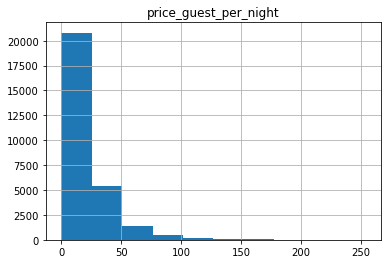

In [103]:
# count
clean_rh.hist('price_guest_per_night')

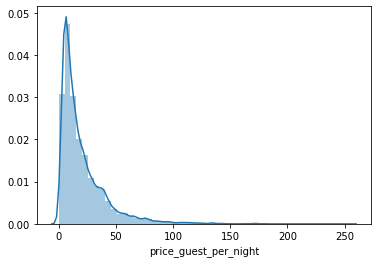

In [104]:
# distribution
sns.distplot(clean_rh['price_guest_per_night'])

#### City Hotel

In [105]:
ch.head()

,hotel,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,assigned_room_type,adr,arrival_date,total_stay_days,total_guests,arrival_month
40066,City Hotel,0,3,1,0.00000,0,PRT,A,58.67000,2015-02-07,3,1.00000,July
40070,City Hotel,0,2,2,0.00000,0,PRT,A,86.00000,2015-03-07,2,2.00000,July
40071,City Hotel,0,2,2,0.00000,0,PRT,A,43.00000,2015-03-07,2,2.00000,July
40072,City Hotel,0,2,2,0.00000,0,PRT,A,86.00000,2015-03-07,2,2.00000,July
40073,City Hotel,0,2,1,0.00000,0,PRT,A,63.00000,2015-03-07,2,1.00000,July


In [106]:
# Statistical characteristics
ch['adr'].describe()

count   45149.00000
mean      108.27313
std        37.60051
min         1.00000
25%        80.75000
50%       100.20000
75%       126.90000
max       510.00000
Name: adr, dtype: float64

In [107]:
ch['total_stay_days'].describe()

count   45149.00000
mean        2.95435
std         1.69591
min         1.00000
25%         2.00000
50%         3.00000
75%         4.00000
max        57.00000
Name: total_stay_days, dtype: float64

In [108]:
ch['total_guests'].describe()

count   45149.00000
mean        1.94839
std         0.66404
min         0.00000
25%         2.00000
50%         2.00000
75%         2.00000
max        12.00000
Name: total_guests, dtype: float64

In [109]:
# clean data: total_guests=0
clean_ch = ch[ch['total_guests'] > 0]

In [110]:
# price_guest_per_night = adr / total_stay_days / total_guests
clean_ch['price_guest_per_night'] = clean_ch['adr']/clean_ch['total_stay_days']/clean_ch['total_guests']
clean_ch['price_guest_per_night'].describe()

<ipython-input-110-b54d1fc4922d>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



count   45119.00000
mean       29.68864
std        26.22610
min         0.16000
25%        12.69750
50%        20.24500
75%        37.50000
max       510.00000
Name: price_guest_per_night, dtype: float64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fad12e47df0>]],
      dtype=object)

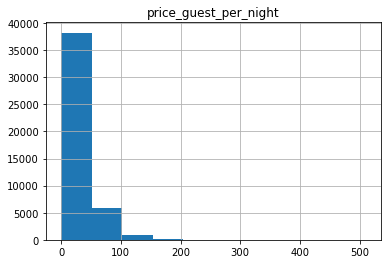

In [111]:
# count
clean_ch.hist('price_guest_per_night')

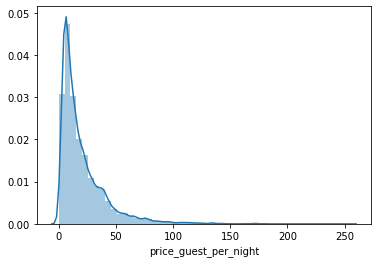

In [112]:
# distribution
sns.distplot(clean_rh['price_guest_per_night'])

Customers tend to choose more lower prices for different types of hotels, while a small number of customers at resort hotels choose to book higher prices for consumption.

## 3.3 How long does the guest stay in the hotel?
- Huang ZeFei

In [113]:
df2['total_stay_days'].describe()

count   73388.00000
mean        3.43401
std         2.53348
min         1.00000
25%         2.00000
50%         3.00000
75%         4.00000
max        69.00000
Name: total_stay_days, dtype: float64

In [114]:
df2['total_stay_days'].value_counts()

3     15604
1     15280
2     15154
4     10971
7      5666
5      5093
6      2303
10      776
8       707
14      653
9       518
11      272
12      120
13       89
15       36
21       36
28       22
16       18
17       15
25       14
22        9
19        6
18        6
35        5
42        3
23        2
56        1
69        1
45        1
38        1
29        1
34        1
30        1
24        1
20        1
60        1
Name: total_stay_days, dtype: int64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fad01fbe6a0>]],
      dtype=object)

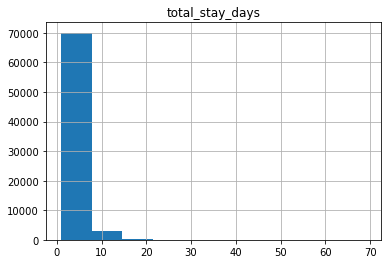

In [115]:
# count
df2.hist('total_stay_days')

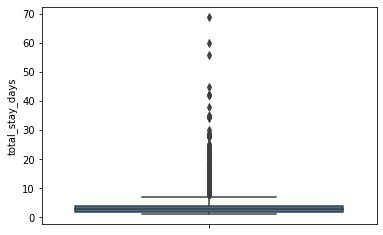

In [116]:
sns.boxplot(df2['total_stay_days'],orient = "v")

In [117]:
# This is the total_stay_days value statistics

clean_rh['total_stay_days'].describe()

count   28269.00000
mean        4.20471
std         3.35129
min         1.00000
25%         2.00000
50%         3.00000
75%         7.00000
max        69.00000
Name: total_stay_days, dtype: float64

In [118]:
clean_rh['total_stay_days'].value_counts()

1     6499
7     4423
2     4388
3     3796
4     3301
5     1890
6     1195
10     696
14     628
8      502
9      402
11     239
12      87
13      75
21      35
28      22
15      22
25      14
16      12
17      11
22       7
35       5
18       5
19       4
42       3
38       1
69       1
30       1
56       1
60       1
29       1
45       1
23       1
Name: total_stay_days, dtype: int64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7facc1044970>]],
      dtype=object)

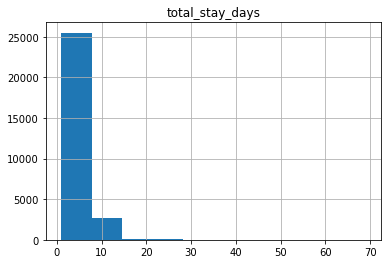

In [119]:
# count
clean_rh.hist('total_stay_days')

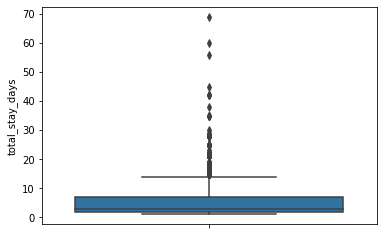

In [120]:
sns.boxplot(clean_rh['total_stay_days'],orient = "v")

### city hotel 

In [121]:
clean_ch['total_stay_days'].describe()

count   45119.00000
mean        2.95113
std         1.67274
min         1.00000
25%         2.00000
50%         3.00000
75%         4.00000
max        34.00000
Name: total_stay_days, dtype: float64

In [122]:
#According to the statistics of the value of total_stay_days, there were 11,808 in city Hotel in 3 days.

clean_ch['total_stay_days'].value_counts()

3     11808
2     10766
1      8781
4      7670
5      3203
7      1243
6      1108
8       205
9       116
10       80
11       33
12       33
14       25
13       14
15       14
16        6
17        4
19        2
22        2
23        1
18        1
20        1
21        1
34        1
24        1
Name: total_stay_days, dtype: int64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fad13504340>]],
      dtype=object)

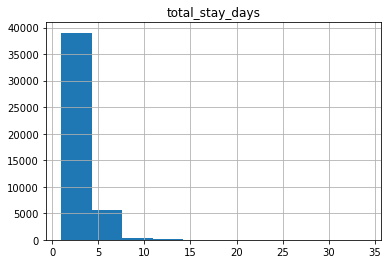

In [123]:
# count
clean_ch.hist('total_stay_days')

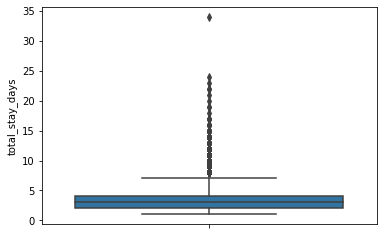

In [124]:
#box plot

sns.boxplot(clean_ch['total_stay_days'],orient = "v")

From the perspective of length of stay, the average length of stay of customers in resort hotels is 4 days, and the average length of stay in city hotels is 2 days. In terms of frequency, there are more 1 day and 7 days in resort hotels. City hotels generally stay 1-4 days, staying more than 5 days is relatively small.
From the box plot, we can see that the middle part of the resort hotel (25%-75%) is concentrated in about 2-7 days, and more can reach dozens of days. For city hotels, it is concentrated in 2-4 days, and the longest is 7 days.In general, the resort hotel stays longer than the city hotel.

## 3.4 Which room types are booked the most?
- XIE Yuxiang 

In [125]:
import pandas as pd 
import numpy as np

In [126]:
df = pd.read_csv('../data/' + 'hotel_bookings.csv')

In [127]:
df = df[['hotel', 'is_canceled', 'arrival_date_year', 'arrival_date_month', 
         'arrival_date_day_of_month','stays_in_weekend_nights','adults', 'children', 'babies', 'customer_type','reserved_room_type', 'adr']].copy()
df.head()

,hotel,is_canceled,arrival_date_year,arrival_date_month,arrival_date_day_of_month,stays_in_weekend_nights,adults,children,babies,customer_type,reserved_room_type,adr
0,Resort Hotel,0,2015,July,1,0,2,0.00000,0,Transient,C,0.00000
1,Resort Hotel,0,2015,July,1,0,2,0.00000,0,Transient,C,0.00000
2,Resort Hotel,0,2015,July,1,0,1,0.00000,0,Transient,A,75.00000
3,Resort Hotel,0,2015,July,1,0,1,0.00000,0,Transient,A,75.00000
4,Resort Hotel,0,2015,July,1,0,2,0.00000,0,Transient,A,98.00000


### Clean the data

In [128]:
## Clean up the reservation but did not pay
no_pay = list(df.loc[df['adr']==0].index)
df.drop(df.index[no_pay], inplace=True)

In [129]:
month = df[['arrival_date_month', 'reserved_room_type']]

In [130]:
data = df.copy()

In [131]:
# convert month to number 
data.loc[data['arrival_date_month']=='January', 'arrival_date_month'] = '01'
data.loc[data['arrival_date_month']=='February', 'arrival_date_month'] = '02'
data.loc[data['arrival_date_month']=='March', 'arrival_date_month'] = '03'
data.loc[data['arrival_date_month']=='April', 'arrival_date_month'] = '04'
data.loc[data['arrival_date_month']=='May', 'arrival_date_month'] = '05'
data.loc[data['arrival_date_month']=='June', 'arrival_date_month'] = '06'
data.loc[data['arrival_date_month']=='July', 'arrival_date_month'] = '07'
data.loc[data['arrival_date_month']=='August', 'arrival_date_month'] = '08'
data.loc[data['arrival_date_month']=='September', 'arrival_date_month'] = '09'
data.loc[data['arrival_date_month']=='October', 'arrival_date_month'] = '10'
data.loc[data['arrival_date_month']=='November', 'arrival_date_month'] = '11'
data.loc[data['arrival_date_month']=='December', 'arrival_date_month'] = '12'

In [132]:
# convert day format
data.loc[data['arrival_date_day_of_month']== 1, 'arrival_date_day_of_month'] = '01'
data.loc[data['arrival_date_day_of_month']== 2, 'arrival_date_day_of_month'] = '02'
data.loc[data['arrival_date_day_of_month']== 3, 'arrival_date_day_of_month'] = '03'
data.loc[data['arrival_date_day_of_month']== 4, 'arrival_date_day_of_month'] = '04'
data.loc[data['arrival_date_day_of_month']== 5, 'arrival_date_day_of_month'] = '06'
data.loc[data['arrival_date_day_of_month']== 7, 'arrival_date_day_of_month'] = '07'
data.loc[data['arrival_date_day_of_month']== 8, 'arrival_date_day_of_month'] = '08'
data.loc[data['arrival_date_day_of_month']== 9, 'arrival_date_day_of_month'] = '09'

In [133]:
data.insert(data.shape[1], 'd', '/')
data['arrival_date'] = data['arrival_date_day_of_month'].map(str) + data['d'] + data['arrival_date_month'].map(str) + data['d'] + data['arrival_date_year'].map(str)
data['total_guests'] = data['adults'] + data['children'] + data['babies']
data.drop(['arrival_date_year', 'arrival_date_month', 'arrival_date_day_of_month', 'd'], axis=1, inplace=True)
data['arrival_month'] = month['arrival_date_month']
data.head()

,hotel,is_canceled,stays_in_weekend_nights,adults,children,babies,customer_type,reserved_room_type,adr,arrival_date,total_guests,arrival_month
2,Resort Hotel,0,0,1,0.00000,0,Transient,A,75.00000,01/07/2015,1.00000,July
3,Resort Hotel,0,0,1,0.00000,0,Transient,A,75.00000,01/07/2015,1.00000,July
4,Resort Hotel,0,0,2,0.00000,0,Transient,A,98.00000,01/07/2015,2.00000,July
5,Resort Hotel,0,0,2,0.00000,0,Transient,A,98.00000,01/07/2015,2.00000,July
6,Resort Hotel,0,0,2,0.00000,0,Transient,C,107.00000,01/07/2015,2.00000,July


In [134]:
data1 = data.copy()
data1.loc[:, 'is_canceled'].value_counts()

0    73420
1    44011
Name: is_canceled, dtype: int64

In [135]:
# Clean up cancelled orders
data1 = data1.loc[data['is_canceled']==0]
clean_data1 = data1.copy()
clean_data1.drop('is_canceled', axis=1, inplace=True)
clean_data1.head()

,hotel,stays_in_weekend_nights,adults,children,babies,customer_type,reserved_room_type,adr,arrival_date,total_guests,arrival_month
2,Resort Hotel,0,1,0.00000,0,Transient,A,75.00000,01/07/2015,1.00000,July
3,Resort Hotel,0,1,0.00000,0,Transient,A,75.00000,01/07/2015,1.00000,July
4,Resort Hotel,0,2,0.00000,0,Transient,A,98.00000,01/07/2015,2.00000,July
5,Resort Hotel,0,2,0.00000,0,Transient,A,98.00000,01/07/2015,2.00000,July
6,Resort Hotel,0,2,0.00000,0,Transient,C,107.00000,01/07/2015,2.00000,July


In [136]:
# Resort Hotel
rh1 = clean_data1.loc[clean_data1['hotel']=='Resort Hotel']
rh1.head()

,hotel,stays_in_weekend_nights,adults,children,babies,customer_type,reserved_room_type,adr,arrival_date,total_guests,arrival_month
2,Resort Hotel,0,1,0.00000,0,Transient,A,75.00000,01/07/2015,1.00000,July
3,Resort Hotel,0,1,0.00000,0,Transient,A,75.00000,01/07/2015,1.00000,July
4,Resort Hotel,0,2,0.00000,0,Transient,A,98.00000,01/07/2015,2.00000,July
5,Resort Hotel,0,2,0.00000,0,Transient,A,98.00000,01/07/2015,2.00000,July
6,Resort Hotel,0,2,0.00000,0,Transient,C,107.00000,01/07/2015,2.00000,July


In [137]:
# City Hotel
ch1 = clean_data1.loc[clean_data1['hotel']=='City Hotel']
ch1.head()

,hotel,stays_in_weekend_nights,adults,children,babies,customer_type,reserved_room_type,adr,arrival_date,total_guests,arrival_month
40066,City Hotel,0,1,0.00000,0,Transient-Party,A,58.67000,02/07/2015,1.00000,July
40070,City Hotel,0,2,0.00000,0,Transient-Party,A,86.00000,03/07/2015,2.00000,July
40071,City Hotel,0,2,0.00000,0,Transient-Party,A,43.00000,03/07/2015,2.00000,July
40072,City Hotel,0,2,0.00000,0,Transient-Party,A,86.00000,03/07/2015,2.00000,July
40073,City Hotel,0,1,0.00000,0,Transient-Party,A,63.00000,03/07/2015,1.00000,July


### Both City Hotel and Resort Hotel

In [138]:
df2 = clean_data1.copy()

In [139]:
df2['reserved_room_type'].describe()

count     73420
unique        9
top           A
freq      51097
Name: reserved_room_type, dtype: object

In [140]:
roomtype_df = df2['reserved_room_type'].value_counts()

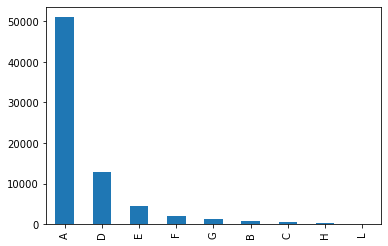

In [141]:
roomtype_df.plot(kind = 'bar', rot = 90)

### City Hotel  

In [142]:
# City Hotel
ch1 = clean_data1.loc[clean_data1['hotel']=='City Hotel']
ch1.head()

,hotel,stays_in_weekend_nights,adults,children,babies,customer_type,reserved_room_type,adr,arrival_date,total_guests,arrival_month
40066,City Hotel,0,1,0.00000,0,Transient-Party,A,58.67000,02/07/2015,1.00000,July
40070,City Hotel,0,2,0.00000,0,Transient-Party,A,86.00000,03/07/2015,2.00000,July
40071,City Hotel,0,2,0.00000,0,Transient-Party,A,43.00000,03/07/2015,2.00000,July
40072,City Hotel,0,2,0.00000,0,Transient-Party,A,86.00000,03/07/2015,2.00000,July
40073,City Hotel,0,1,0.00000,0,Transient-Party,A,63.00000,03/07/2015,1.00000,July


In [143]:
df3 = ch1.copy()

In [144]:
df3['reserved_room_type'].describe()

count     45149
unique        7
top           A
freq      34529
Name: reserved_room_type, dtype: object

In [145]:
roomtype_df = df3['reserved_room_type'].value_counts()

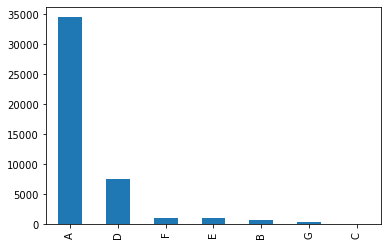

In [146]:
roomtype_df.plot(kind = 'bar', rot = 90)

### Resort Hotel

In [147]:
# Resort Hotel
rh1 = clean_data1.loc[clean_data1['hotel']=='Resort Hotel']
rh1.head()

,hotel,stays_in_weekend_nights,adults,children,babies,customer_type,reserved_room_type,adr,arrival_date,total_guests,arrival_month
2,Resort Hotel,0,1,0.00000,0,Transient,A,75.00000,01/07/2015,1.00000,July
3,Resort Hotel,0,1,0.00000,0,Transient,A,75.00000,01/07/2015,1.00000,July
4,Resort Hotel,0,2,0.00000,0,Transient,A,98.00000,01/07/2015,2.00000,July
5,Resort Hotel,0,2,0.00000,0,Transient,A,98.00000,01/07/2015,2.00000,July
6,Resort Hotel,0,2,0.00000,0,Transient,C,107.00000,01/07/2015,2.00000,July


In [148]:
df4 = rh1.copy()

In [149]:
df4['reserved_room_type'].describe()

count     28271
unique        9
top           A
freq      16568
Name: reserved_room_type, dtype: object

In [150]:
roomtype_df = df4['reserved_room_type'].value_counts()

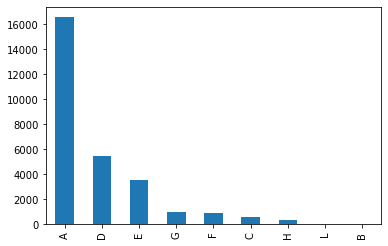

In [151]:
roomtype_df.plot(kind = 'bar', rot = 90)

The different room types of different types of hotels are concentrated in type A/D/E/F. Among them, the number of bookings of type A is the largest demand, while the demand for type G rooms in resort hotels is more than in city hotels.

## 3.5 Which customer types are booked the most? 

### Both city hotel and resort hotel  

In [152]:
df2['customer_type'].describe()

count         73420
unique            4
top       Transient
freq          51806
Name: customer_type, dtype: object

In [153]:
df2['customer_type'].value_counts()

Transient          51806
Transient-Party    18321
Contract            2791
Group                502
Name: customer_type, dtype: int64

In [154]:
customer_df = df2[['customer_type', 'total_guests']].copy()

In [155]:
new_df = customer_df.groupby('customer_type').sum()
new_df.reset_index(inplace=True)
new_df

,customer_type,total_guests
0,Contract,5582.00000
1,Group,899.00000
2,Transient,104752.00000
3,Transient-Party,32143.00000


In [156]:
#Tree plot
df = new_df.copy()
df['Root Node'] = 'customer types' # in order to have a single root node 
fig = px.treemap(df, path=['Root Node', 'customer_type'], values='total_guests', 
                 color='total_guests', hover_data=['customer_type'],
                 color_continuous_scale='Rainbow')
fig.show()

### City Hotel  

In [157]:
# City Hotel
ch1 = clean_data1.loc[clean_data1['hotel']=='City Hotel']
ch1.head()

,hotel,stays_in_weekend_nights,adults,children,babies,customer_type,reserved_room_type,adr,arrival_date,total_guests,arrival_month
40066,City Hotel,0,1,0.00000,0,Transient-Party,A,58.67000,02/07/2015,1.00000,July
40070,City Hotel,0,2,0.00000,0,Transient-Party,A,86.00000,03/07/2015,2.00000,July
40071,City Hotel,0,2,0.00000,0,Transient-Party,A,43.00000,03/07/2015,2.00000,July
40072,City Hotel,0,2,0.00000,0,Transient-Party,A,86.00000,03/07/2015,2.00000,July
40073,City Hotel,0,1,0.00000,0,Transient-Party,A,63.00000,03/07/2015,1.00000,July


In [158]:
ch1['customer_type'].describe()

count         45149
unique            4
top       Transient
freq          31508
Name: customer_type, dtype: object

In [159]:
ch1['customer_type'].value_counts()

Transient          31508
Transient-Party    12201
Contract            1184
Group                256
Name: customer_type, dtype: int64

In [160]:
customer_df = df2[['customer_type', 'total_guests']].copy()

In [161]:
new_df = customer_df.groupby('customer_type').sum()
new_df.reset_index(inplace=True)
new_df

,customer_type,total_guests
0,Contract,5582.00000
1,Group,899.00000
2,Transient,104752.00000
3,Transient-Party,32143.00000


In [162]:
#Tree plot
df = new_df.copy()
df['Root Node'] = 'customer types' # in order to have a single root node 
fig = px.treemap(df, path=['Root Node', 'customer_type'], values='total_guests', 
                 color='total_guests', hover_data=['customer_type'],
                 color_continuous_scale='Rainbow')
fig.show()

### Resort Hotel 

In [163]:
# Resort Hotel
rh1 = clean_data1.loc[clean_data1['hotel']=='Resort Hotel']
rh1.head()

,hotel,stays_in_weekend_nights,adults,children,babies,customer_type,reserved_room_type,adr,arrival_date,total_guests,arrival_month
2,Resort Hotel,0,1,0.00000,0,Transient,A,75.00000,01/07/2015,1.00000,July
3,Resort Hotel,0,1,0.00000,0,Transient,A,75.00000,01/07/2015,1.00000,July
4,Resort Hotel,0,2,0.00000,0,Transient,A,98.00000,01/07/2015,2.00000,July
5,Resort Hotel,0,2,0.00000,0,Transient,A,98.00000,01/07/2015,2.00000,July
6,Resort Hotel,0,2,0.00000,0,Transient,C,107.00000,01/07/2015,2.00000,July


In [164]:
rh1['customer_type'].describe()

count         28271
unique            4
top       Transient
freq          20298
Name: customer_type, dtype: object

In [165]:
rh1['customer_type'].value_counts()

Transient          20298
Transient-Party     6120
Contract            1607
Group                246
Name: customer_type, dtype: int64

In [166]:
#Tree plot
df = new_df.copy()
df['Root Node'] = 'customer types' # in order to have a single root node 
fig = px.treemap(df, path=['Root Node', 'customer_type'], values='total_guests', 
                 color='total_guests', hover_data=['customer_type'],
                 color_continuous_scale='Rainbow')
fig.show()

Whether it is the city hotel or the resort hotel, the transient guests are the most, followed by transient-party and contract. Moreover, From the perspective of the number of bookings, the number of bookings for city hotels is more than that for resort hotels.

## 3.6 Which month has the most cancellations and most booking? 
- Chiu SingYuk 

In [167]:
path = '../data/hotel_bookings.csv'
df = pd.read_csv(path)

In [168]:
df2 = df.copy()
df2 = df2[['hotel', 'is_canceled', 'arrival_date_year', 'arrival_date_month', 
         'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 
         'adults', 'children', 'babies', 'country', 'assigned_room_type', 'adr']]
df2.head()
month = df2[['arrival_date_month', 'assigned_room_type']]
data = df2.copy()

In [169]:
# convert month to number 
data.loc[data['arrival_date_month']=='January', 'arrival_date_month'] = '01'
data.loc[data['arrival_date_month']=='February', 'arrival_date_month'] = '02'
data.loc[data['arrival_date_month']=='March', 'arrival_date_month'] = '03'
data.loc[data['arrival_date_month']=='April', 'arrival_date_month'] = '04'
data.loc[data['arrival_date_month']=='May', 'arrival_date_month'] = '05'
data.loc[data['arrival_date_month']=='June', 'arrival_date_month'] = '06'
data.loc[data['arrival_date_month']=='July', 'arrival_date_month'] = '07'
data.loc[data['arrival_date_month']=='August', 'arrival_date_month'] = '08'
data.loc[data['arrival_date_month']=='September', 'arrival_date_month'] = '09'
data.loc[data['arrival_date_month']=='October', 'arrival_date_month'] = '10'
data.loc[data['arrival_date_month']=='November', 'arrival_date_month'] = '11'
data.loc[data['arrival_date_month']=='December', 'arrival_date_month'] = '12'

### Hotel reservation booking situation# 

In [170]:
dfBc = df.copy()
dfB = pd.DataFrame(df, columns=['is_canceled'])
dfB.loc[dfB['is_canceled'] == 0 ] = 'F'#Change hotel reservation 0 to F
dfB.loc[dfB['is_canceled'] == 1 ] = 'T'#Change the cancellation of hotel reservation 1 to T
#Bipolar reversal, it is convenient to use the pivot function to draw after waiting, because if you don’t reverse 0 and 1, then aggfunc={'is_canceled': np.sum}) This statistic is the total number of cancelled hotels each month.
dfB.loc[dfB['is_canceled'] == 'F' ] = 1 #1 represents hotel reservation
dfB.loc[dfB['is_canceled'] == 'T' ] = 0 #0 means cancel hotel reservation
dfBc['is_canceled'] = dfB['is_canceled']

dataB = data.copy()
dfB = pd.DataFrame(data, columns=['is_canceled'])
dfB.loc[dfB['is_canceled'] == 0 ] = 'F'#Change hotel reservation 0 to F
dfB.loc[dfB['is_canceled'] == 1 ] = 'T'#Change the cancellation of hotel reservation 1 to T
#Bipolar reversal, it is convenient to use the pivot function to draw after waiting, because if you don’t reverse 0 and 1, then aggfunc={'is_canceled': np.sum}) This statistic is the total number of cancelled hotels each month.
dfB.loc[dfB['is_canceled'] == 'F' ] = 1 #1 represents hotel reservation
dfB.loc[dfB['is_canceled'] == 'T' ] = 0 #0 means cancel hotel reservation
dataB['is_canceled'] = dfB['is_canceled']

In [171]:
Month = ['January','February','March','April','May','June','July','August','September','October','November','December']
Book_Count = []
for i in Month:
    dfB = dfBc[(dfBc['is_canceled'] == 1) & (df['arrival_date_month']== i)]
    count = dfB['is_canceled'].sum()
    Book_Count.append(count)
Book_Count

[4122, 5372, 6645, 6565, 7114, 6404, 7919, 8638, 6392, 6914, 4672, 4409]

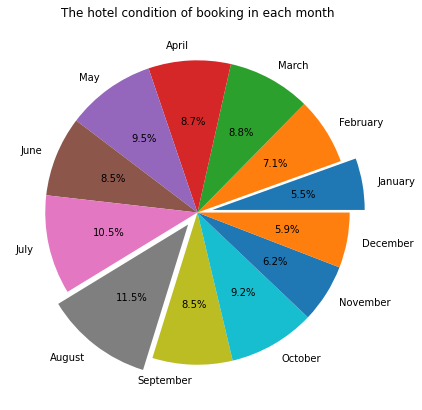

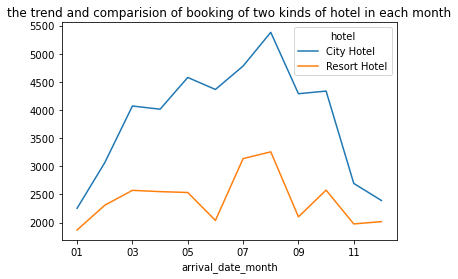

In [172]:
months = 'January','February','March','April','May','June','July','August','September','October','November','December'
explode = (0.1, 0, 0, 0, 0, 0, 0, 0.1, 0, 0, 0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

# Creating plot 
fig = plt.figure(figsize =(10, 7)) 
plt.pie(Book_Count, labels = months, explode=explode, autopct='%1.1f%%') 
plt.title('The hotel condition of booking in each month')

# show plot 
plt.show() 


table2 = pd.pivot_table(dataB, values='is_canceled', index=['arrival_date_month'], columns=['hotel'], 
                      aggfunc={'is_canceled': np.sum})
table2.plot(title = 'the trend and comparision of booking of two kinds of hotel in each month')
plt.show()

In terms of booking situation, city hotels saw a sharp decline from July to August, while resort hotels increased during the same period. Overall, the monthly passenger flow of city hotels changed more than resort hotels.

### Hotel reservation cancellation situation 

In [173]:
Month = ['January','February','March','April','May','June','July','August','September','October','November','December']
Cancel_Count = []
for i in Month:
    dfC = df[(df['is_canceled'] == 1) & (df['arrival_date_month']== i)]
    count = dfC['is_canceled'].sum()
    Cancel_Count.append(count)
Cancel_Count

[1807, 2696, 3149, 4524, 4677, 4535, 4742, 5239, 4116, 4246, 2122, 2371]

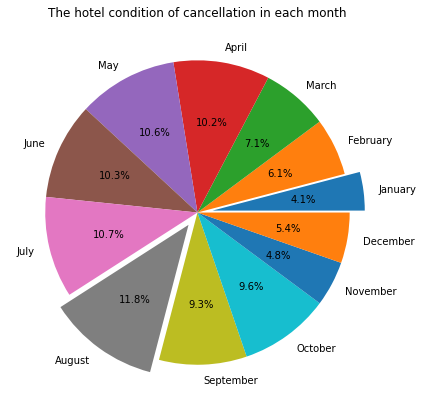

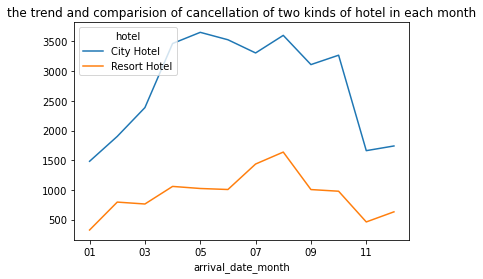

In [174]:
months = 'January','February','March','April','May','June','July','August','September','October','November','December'
explode = (0.1, 0, 0, 0, 0, 0, 0, 0.1, 0, 0, 0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

# Creating plot 
fig = plt.figure(figsize =(10, 7)) 
plt.pie(Cancel_Count, labels = months, explode=explode, autopct='%1.1f%%') 
plt.title('The hotel condition of cancellation in each month')

# show plot 
plt.show() 

table1 = pd.pivot_table(data, values='is_canceled', index=['arrival_date_month'], columns=['hotel'], 
                      aggfunc={'is_canceled': np.sum})
#table1
table1.plot(title = 'the trend and comparision of cancellation of two kinds of hotel in each month')
plt.show()

In terms of cancellation rates, the winter cancellation rates of the two hotels both are low. The summer cancellation rate of the city hotel has decreased, while the cancellation rate of the resort hotel has increased.

## 3.7 How does the price per night change during the years? 
- Luo YiFeng 

In [175]:
clean_data.head()

,hotel,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,assigned_room_type,adr,arrival_date,total_stay_days,total_guests,arrival_month
2,Resort Hotel,0,1,1,0.00000,0,GBR,C,75.00000,2015-01-07,1,1.00000,July
3,Resort Hotel,0,1,1,0.00000,0,GBR,A,75.00000,2015-01-07,1,1.00000,July
4,Resort Hotel,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July
5,Resort Hotel,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July
6,Resort Hotel,0,2,2,0.00000,0,PRT,C,107.00000,2015-01-07,2,2.00000,July


In [176]:
#ch.head()

In [177]:
#rh.head()

In [178]:
clean_data.loc[:, 'assigned_room_type'].value_counts()# (A B C D E F G H I K ) 

A    40394
D    18659
E     5735
F     2733
C     1885
G     1681
B     1587
H      450
I      158
K      138
Name: assigned_room_type, dtype: int64

In [179]:
ch.loc[:, 'assigned_room_type'].value_counts() # (A B C D E F G K ) NO H I IN IT 

A    29565
D    10526
E     1586
B     1442
F     1247
G      513
K      138
C      132
Name: assigned_room_type, dtype: int64

In [180]:
rh.loc[:, 'assigned_room_type'].value_counts()# (A B C D E F G H I) NO K IN IT 

A    10829
D     8133
E     4149
C     1753
F     1486
G     1168
H      450
I      158
B      145
Name: assigned_room_type, dtype: int64

In [181]:
# pre night price = adr / total stay days
clean_data['pre_night_price'] = clean_data['adr'] / clean_data['total_stay_days']
clean_data.head()

,hotel,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,country,assigned_room_type,adr,arrival_date,total_stay_days,total_guests,arrival_month,pre_night_price
2,Resort Hotel,0,1,1,0.00000,0,GBR,C,75.00000,2015-01-07,1,1.00000,July,75.00000
3,Resort Hotel,0,1,1,0.00000,0,GBR,A,75.00000,2015-01-07,1,1.00000,July,75.00000
4,Resort Hotel,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July,49.00000
5,Resort Hotel,0,2,2,0.00000,0,GBR,A,98.00000,2015-01-07,2,2.00000,July,49.00000
6,Resort Hotel,0,2,2,0.00000,0,PRT,C,107.00000,2015-01-07,2,2.00000,July,53.50000


### Both  hotels per night change during the years 

In [182]:
data = clean_data[['hotel','pre_night_price','arrival_date']]
data.head()

,hotel,pre_night_price,arrival_date
2,Resort Hotel,75.00000,2015-01-07
3,Resort Hotel,75.00000,2015-01-07
4,Resort Hotel,49.00000,2015-01-07
5,Resort Hotel,49.00000,2015-01-07
6,Resort Hotel,53.50000,2015-01-07


In [183]:
ch_pri = data.loc[data['hotel']=='City Hotel']
rh_pri = data.loc[data['hotel']=='Resort Hotel']

In [184]:
ch_data = ch_pri.groupby('arrival_date').mean()
ch_data.reset_index(inplace=True)
#ch_data.head()

In [185]:
rh_data = rh_pri.groupby('arrival_date').mean()
rh_data.reset_index(inplace=True)
#rh_data.head()

In [186]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = ch_data['arrival_date'], y = ch_data['pre_night_price'],
                         mode='lines', name='City Hotel Per Night Price'))

fig.add_trace(go.Scatter(x = rh_data['arrival_date'], y = ch_data['pre_night_price'],
                        mode='lines', name='Resort Hotel Per Night Price'))

fig.update_layout(title_text='Trend of Both Hotels Per Night Price', plot_bgcolor='rgb(250, 242, 242)')

fig.show()

In [187]:
# ![tt.png](attachment:tt.png)

According to the trend chart, the price fluctuations of city hotel and resort hotel are quite different, especially in summer and winter. Resort hotel prices are rising while city hotel prices are falling. Combining the number of reservation booking and the number of cancelled reservation shows that summer is the month with the highest prices for resort hotels, and it is also the quarter with the largest number of cancellations.

#### City Hotel 

In [188]:
ch1 = ch.copy()
ch1['pre_night_price'] = ch1['adr'] / ch1['total_stay_days']
#ch1.head()

In [189]:
ch_data = ch1[['assigned_room_type','pre_night_price','arrival_date']]
ch_data.head()

,assigned_room_type,pre_night_price,arrival_date
40066,A,19.55667,2015-02-07
40070,A,43.00000,2015-03-07
40071,A,21.50000,2015-03-07
40072,A,43.00000,2015-03-07
40073,A,31.50000,2015-03-07


In [190]:
# A	B	C	D	E	F	G	K
a_ch = ch_data.loc[ch_data['assigned_room_type']=='A']
b_ch = ch_data.loc[ch_data['assigned_room_type']=='B']
c_ch = ch_data.loc[ch_data['assigned_room_type']=='C']
d_ch = ch_data.loc[ch_data['assigned_room_type']=='D']
e_ch = ch_data.loc[ch_data['assigned_room_type']=='E']
g_ch = ch_data.loc[ch_data['assigned_room_type']=='G']
k_ch = ch_data.loc[ch_data['assigned_room_type']=='K']

In [191]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = a_ch['arrival_date'], y = a_ch['pre_night_price'],
                         mode='lines', name='Room Type A Price'))

fig.add_trace(go.Scatter(x = b_ch['arrival_date'], y = b_ch['pre_night_price'],
                         mode='lines', name='Room Type B Price'))

fig.add_trace(go.Scatter(x = c_ch['arrival_date'], y = c_ch['pre_night_price'],
                         mode='lines', name='Room Type C Price'))

fig.add_trace(go.Scatter(x = d_ch['arrival_date'], y = d_ch['pre_night_price'],
                         mode='lines', name='Room Type D Price'))

fig.add_trace(go.Scatter(x = e_ch['arrival_date'], y = e_ch['pre_night_price'],
                         mode='lines', name='Room Type E Price'))

fig.add_trace(go.Scatter(x = g_ch['arrival_date'], y = g_ch['pre_night_price'],
                         mode='lines', name='Room Type G Price'))


fig.add_trace(go.Scatter(x = k_ch['arrival_date'], y = k_ch['pre_night_price'],
                         mode='lines', name='Room Type K Price'))


fig.update_layout(title_text='Trend of Different Types of room in City Hotel', plot_bgcolor='rgb(250, 242, 242)')

fig.show()

In [192]:
# ![ew.png](attachment:ew.png)

In [193]:
# 3D Plot
fig = px.scatter_3d(ch_data, x=ch_data['assigned_room_type'], 
                    y=ch_data['arrival_date'], 
                    z=ch_data['pre_night_price'],
                    color='assigned_room_type')
fig.update_layout(scene_zaxis_type="log", showlegend=False, height=1000)
fig.show()

In [194]:
# ![3d.png](attachment:3d.png)

In [195]:
ch_pivot = pd.pivot_table(ch_data, index='arrival_date', columns='assigned_room_type', 
                          values='pre_night_price', aggfunc=np.mean)

In [196]:
ch_pivot.head()

assigned_room_type,A,B,C,D,E,F,G,K
arrival_date,,,,,,,,
2015-01-07,47.40000,nan,nan,nan,nan,nan,nan,nan
2015-01-08,34.70370,28.41667,nan,22.09333,nan,nan,nan,nan
2015-01-09,30.94783,43.18571,nan,55.80104,27.38889,55.00000,57.84375,nan
2015-01-10,56.41391,nan,nan,49.10964,nan,nan,nan,nan
2015-01-11,31.18692,17.00000,nan,27.84953,nan,nan,nan,nan


In [197]:
#ch_pivot.describe()

In [198]:
# Using mean value to fill na 
ch_pivot['A'].fillna((ch_pivot['A'].mean()), inplace=True)
ch_pivot['B'].fillna((ch_pivot['B'].mean()), inplace=True)
ch_pivot['C'].fillna((ch_pivot['C'].mean()), inplace=True)
ch_pivot['D'].fillna((ch_pivot['D'].mean()), inplace=True)
ch_pivot['E'].fillna((ch_pivot['E'].mean()), inplace=True)
ch_pivot['F'].fillna((ch_pivot['F'].mean()), inplace=True)
ch_pivot['G'].fillna((ch_pivot['G'].mean()), inplace=True)
ch_pivot['K'].fillna((ch_pivot['K'].mean()), inplace=True)

ch_pivot.head()

assigned_room_type,A,B,C,D,E,F,G,K
arrival_date,,,,,,,,
2015-01-07,47.40000,49.57233,67.05962,48.56669,68.74980,88.85551,93.18539,56.66280
2015-01-08,34.70370,28.41667,67.05962,22.09333,68.74980,88.85551,93.18539,56.66280
2015-01-09,30.94783,43.18571,67.05962,55.80104,27.38889,55.00000,57.84375,56.66280
2015-01-10,56.41391,49.57233,67.05962,49.10964,68.74980,88.85551,93.18539,56.66280
2015-01-11,31.18692,17.00000,67.05962,27.84953,68.74980,88.85551,93.18539,56.66280


In [199]:
ch_pivot.index

DatetimeIndex(['2015-01-07', '2015-01-08', '2015-01-09', '2015-01-10',
               '2015-01-11', '2015-01-12', '2015-02-07', '2015-02-08',
               '2015-02-09', '2015-02-10',
               ...
               '2017-11-07', '2017-11-08', '2017-12-01', '2017-12-02',
               '2017-12-03', '2017-12-04', '2017-12-05', '2017-12-06',
               '2017-12-07', '2017-12-08'],
              dtype='datetime64[ns]', name='arrival_date', length=760, freq=None)

Text(0.5, 1.0, 'City Hotel Box Plot ')

<Figure size 1008x576 with 0 Axes>

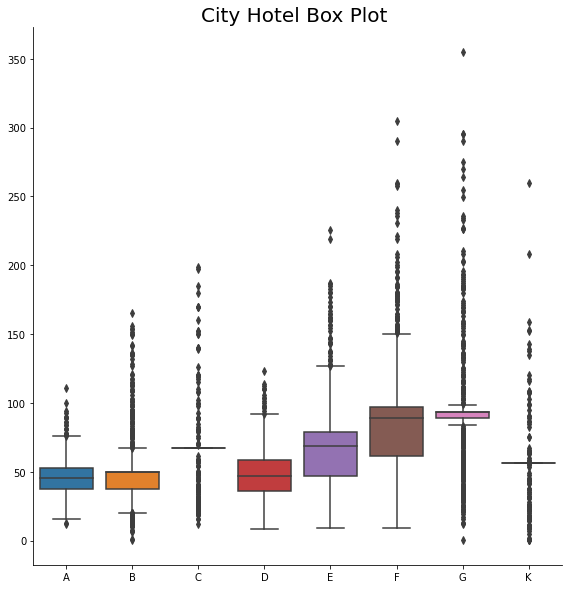

In [200]:
# box plot
plt.figure(figsize=(14,8))
sns.catplot(data=ch_pivot, kind = 'box', height=8)
plt.title('City Hotel Box Plot ', fontsize=20)

#### Resort Hotel 

In [201]:
rh1 = rh.copy()
rh1['pre_night_price'] = rh1['adr'] / rh1['total_stay_days']
#ch1.head()

In [202]:
rh_data = rh1[['assigned_room_type','pre_night_price','arrival_date']]
rh_data.head()

,assigned_room_type,pre_night_price,arrival_date
2,C,75.00000,2015-01-07
3,A,75.00000,2015-01-07
4,A,49.00000,2015-01-07
5,A,49.00000,2015-01-07
6,C,53.50000,2015-01-07


In [203]:
rh_pivot = pd.pivot_table(ch_data, index='arrival_date', columns='assigned_room_type', 
                          values='pre_night_price', aggfunc=np.mean)

In [204]:
rh_pivot.head()

assigned_room_type,A,B,C,D,E,F,G,K
arrival_date,,,,,,,,
2015-01-07,47.40000,nan,nan,nan,nan,nan,nan,nan
2015-01-08,34.70370,28.41667,nan,22.09333,nan,nan,nan,nan
2015-01-09,30.94783,43.18571,nan,55.80104,27.38889,55.00000,57.84375,nan
2015-01-10,56.41391,nan,nan,49.10964,nan,nan,nan,nan
2015-01-11,31.18692,17.00000,nan,27.84953,nan,nan,nan,nan


In [205]:
# A	B	C	D	E	F	G	K
a_rh = rh_data.loc[rh_data['assigned_room_type']=='A']
b_rh = rh_data.loc[rh_data['assigned_room_type']=='B']
c_rh = rh_data.loc[rh_data['assigned_room_type']=='C']
d_rh = rh_data.loc[rh_data['assigned_room_type']=='D']
e_rh = rh_data.loc[rh_data['assigned_room_type']=='E']
f_rh = rh_data.loc[rh_data['assigned_room_type']=='F']
g_rh = rh_data.loc[rh_data['assigned_room_type']=='G']
k_rh = rh_data.loc[rh_data['assigned_room_type']=='K']

In [206]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = a_rh['arrival_date'], y = a_rh['pre_night_price'],
                         mode='lines', name='Room Type A Price'))

fig.add_trace(go.Scatter(x = b_rh['arrival_date'], y = b_rh['pre_night_price'],
                         mode='lines', name='Room Type B Price'))

fig.add_trace(go.Scatter(x = c_rh['arrival_date'], y = c_rh['pre_night_price'],
                         mode='lines', name='Room Type C Price'))

fig.add_trace(go.Scatter(x = d_rh['arrival_date'], y = d_rh['pre_night_price'],
                         mode='lines', name='Room Type D Price'))

fig.add_trace(go.Scatter(x = e_rh['arrival_date'], y = e_rh['pre_night_price'],
                         mode='lines', name='Room Type E Price'))

fig.add_trace(go.Scatter(x = f_rh['arrival_date'], y = f_rh['pre_night_price'],
                         mode='lines', name='Room Type F Price'))

fig.add_trace(go.Scatter(x = g_rh['arrival_date'], y = g_rh['pre_night_price'],
                         mode='lines', name='Room Type G Price'))


fig.add_trace(go.Scatter(x = k_rh['arrival_date'], y = k_rh['pre_night_price'],
                         mode='lines', name='Room Type K Price'))


fig.update_layout(title_text='Trend of Different Types of room in Resort Hotel', plot_bgcolor='rgb(250, 242, 242)')

fig.show()

In [207]:
# 3-D plot
fig = px.scatter_3d(rh_data, x=rh_data['assigned_room_type'], 
                    y=rh_data['arrival_date'], 
                    z=rh_data['pre_night_price'],
                    color='assigned_room_type')
fig.update_layout(scene_zaxis_type="log", showlegend=False, height=1000)
fig.show()

In [208]:
rh_pivot.head()

assigned_room_type,A,B,C,D,E,F,G,K
arrival_date,,,,,,,,
2015-01-07,47.40000,nan,nan,nan,nan,nan,nan,nan
2015-01-08,34.70370,28.41667,nan,22.09333,nan,nan,nan,nan
2015-01-09,30.94783,43.18571,nan,55.80104,27.38889,55.00000,57.84375,nan
2015-01-10,56.41391,nan,nan,49.10964,nan,nan,nan,nan
2015-01-11,31.18692,17.00000,nan,27.84953,nan,nan,nan,nan


In [209]:
# Using mean value to fill na 
rh_pivot['A'].fillna((rh_pivot['A'].mean()), inplace=True)
rh_pivot['B'].fillna((rh_pivot['B'].mean()), inplace=True)
rh_pivot['C'].fillna((rh_pivot['C'].mean()), inplace=True)
rh_pivot['D'].fillna((rh_pivot['D'].mean()), inplace=True)
rh_pivot['E'].fillna((rh_pivot['E'].mean()), inplace=True)
rh_pivot['F'].fillna((rh_pivot['F'].mean()), inplace=True)
rh_pivot['G'].fillna((rh_pivot['G'].mean()), inplace=True)
rh_pivot['K'].fillna((rh_pivot['K'].mean()), inplace=True)

ch_pivot.head()

assigned_room_type,A,B,C,D,E,F,G,K
arrival_date,,,,,,,,
2015-01-07,47.40000,49.57233,67.05962,48.56669,68.74980,88.85551,93.18539,56.66280
2015-01-08,34.70370,28.41667,67.05962,22.09333,68.74980,88.85551,93.18539,56.66280
2015-01-09,30.94783,43.18571,67.05962,55.80104,27.38889,55.00000,57.84375,56.66280
2015-01-10,56.41391,49.57233,67.05962,49.10964,68.74980,88.85551,93.18539,56.66280
2015-01-11,31.18692,17.00000,67.05962,27.84953,68.74980,88.85551,93.18539,56.66280


Text(0.5, 1.0, 'Resort Hotel Box Plot ')

<Figure size 1008x576 with 0 Axes>

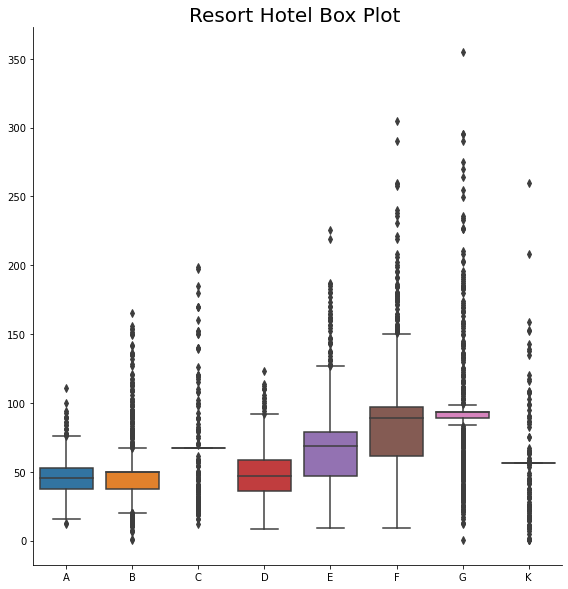

In [180]:
# box plot
plt.figure(figsize=(14,8))
sns.catplot(data=rh_pivot, kind = 'box', height=8)
plt.title('Resort Hotel Box Plot ', fontsize=20)

From the 3D plot and line chart, we can see that the price of typeA, typeB and typeD have been steadily rising year by year, and the price has risen the most during the summer. However, the price of typeC rises the most during the winter, and the price fluctuates the most. And typeG has the highest price among all price types, but in September 2017, the price rose to the highest value in the past two years.

# 4. Prediction Part

- Luo YiFeng

In [148]:
path = '../data/hotel_bookings.csv'
df = pd.read_csv(path)
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.00000,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,nan,nan,0,Transient,0.00000,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.00000,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,nan,nan,0,Transient,0.00000,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.00000,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,nan,nan,0,Transient,75.00000,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.00000,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.00000,nan,0,Transient,75.00000,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.00000,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.00000,nan,0,Transient,98.00000,0,1,Check-Out,2015-07-03


In [149]:
data = df.copy()

In [150]:
data.drop(['arrival_date_year', 'arrival_date_month', 'arrival_date_week_number','arrival_date_day_of_month', 
           'country', 'meal', 'assigned_room_type', 'reservation_status', 'reservation_status_date'], axis=1, inplace=True)
data.head()

,hotel,is_canceled,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,Resort Hotel,0,342,0,0,2,0.00000,0,Direct,Direct,0,0,0,C,3,No Deposit,nan,nan,0,Transient,0.00000,0,0
1,Resort Hotel,0,737,0,0,2,0.00000,0,Direct,Direct,0,0,0,C,4,No Deposit,nan,nan,0,Transient,0.00000,0,0
2,Resort Hotel,0,7,0,1,1,0.00000,0,Direct,Direct,0,0,0,A,0,No Deposit,nan,nan,0,Transient,75.00000,0,0
3,Resort Hotel,0,13,0,1,1,0.00000,0,Corporate,Corporate,0,0,0,A,0,No Deposit,304.00000,nan,0,Transient,75.00000,0,0
4,Resort Hotel,0,14,0,2,2,0.00000,0,Online TA,TA/TO,0,0,0,A,0,No Deposit,240.00000,nan,0,Transient,98.00000,0,1


In [151]:
data['market_segment'].value_counts()

Online TA        56477
Offline TA/TO    24219
Groups           19811
Direct           12606
Corporate         5295
Complementary      743
Aviation           237
Undefined            2
Name: market_segment, dtype: int64

In [152]:
data.loc[data['market_segment']=='Undefined', 'market_segment'] = 0
data.loc[data['market_segment']=='Aviation', 'market_segment'] = 1
data.loc[data['market_segment']=='Complementary', 'market_segment'] = 2
data.loc[data['market_segment']=='Corporate', 'market_segment'] = 3
data.loc[data['market_segment']=='Direct', 'market_segment'] = 4
data.loc[data['market_segment']=='Groups', 'market_segment'] = 5
data.loc[data['market_segment']=='Offline TA/TO', 'market_segment'] = 6
data.loc[data['market_segment']=='Online TA', 'market_segment'] = 7

In [153]:
data['distribution_channel'].value_counts()

TA/TO        97870
Direct       14645
Corporate     6677
GDS            193
Undefined        5
Name: distribution_channel, dtype: int64

In [154]:
data.loc[data['distribution_channel']=='Undefined', 'distribution_channel'] = 0
data.loc[data['distribution_channel']=='GDS', 'distribution_channel'] = 1
data.loc[data['distribution_channel']=='Corporate', 'distribution_channel'] = 2
data.loc[data['distribution_channel']=='Direct', 'distribution_channel'] = 3
data.loc[data['distribution_channel']=='TA/TO', 'distribution_channel'] = 4

In [155]:
data['reserved_room_type'].value_counts()

A    85994
D    19201
E     6535
F     2897
G     2094
B     1118
C      932
H      601
P       12
L        6
Name: reserved_room_type, dtype: int64

In [156]:
data.loc[data['reserved_room_type']=='A', 'reserved_room_type'] = 0
data.loc[data['reserved_room_type']=='D', 'reserved_room_type'] = 1
data.loc[data['reserved_room_type']=='E', 'reserved_room_type'] = 2
data.loc[data['reserved_room_type']=='F', 'reserved_room_type'] = 3
data.loc[data['reserved_room_type']=='G', 'reserved_room_type'] = 4
data.loc[data['reserved_room_type']=='B', 'reserved_room_type'] = 5
data.loc[data['reserved_room_type']=='C', 'reserved_room_type'] = 6
data.loc[data['reserved_room_type']=='H', 'reserved_room_type'] = 7
data.loc[data['reserved_room_type']=='P', 'reserved_room_type'] = 8
data.loc[data['reserved_room_type']=='L', 'reserved_room_type'] = 9

In [157]:
data['deposit_type'].value_counts()

No Deposit    104641
Non Refund     14587
Refundable       162
Name: deposit_type, dtype: int64

In [158]:
data.loc[data['deposit_type']=='Refundable', 'deposit_type'] = 0
data.loc[data['deposit_type']=='Non Refund', 'deposit_type'] = 1
data.loc[data['deposit_type']=='No Deposit', 'deposit_type'] = 2

In [159]:
data['customer_type'].value_counts()

Transient          89613
Transient-Party    25124
Contract            4076
Group                577
Name: customer_type, dtype: int64

In [160]:
data.loc[data['customer_type']=='Transient', 'customer_type'] = 0
data.loc[data['customer_type']=='Transient-Party', 'customer_type'] = 1
data.loc[data['customer_type']=='Contract', 'customer_type'] = 2
data.loc[data['customer_type']=='Group', 'customer_type'] = 3

In [161]:
data['hotel'].value_counts()

City Hotel      79330
Resort Hotel    40060
Name: hotel, dtype: int64

In [162]:
# RH=1 CH=0
data.loc[data['hotel']=='Resort Hotel', 'hotel'] = 1
data.loc[data['hotel']=='City Hotel', 'hotel'] = 0

In [163]:
data.head() # For both dataset

,hotel,is_canceled,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,1,0,342,0,0,2,0.00000,0,4,3,0,0,0,6,3,2,nan,nan,0,0,0.00000,0,0
1,1,0,737,0,0,2,0.00000,0,4,3,0,0,0,6,4,2,nan,nan,0,0,0.00000,0,0
2,1,0,7,0,1,1,0.00000,0,4,3,0,0,0,0,0,2,nan,nan,0,0,75.00000,0,0
3,1,0,13,0,1,1,0.00000,0,3,2,0,0,0,0,0,2,304.00000,nan,0,0,75.00000,0,0
4,1,0,14,0,2,2,0.00000,0,7,4,0,0,0,0,0,2,240.00000,nan,0,0,98.00000,0,1


In [164]:
datar = data.copy()

In [165]:
# Dataset for RH
rh = datar.loc[datar['hotel']==1].copy()
rh.drop('hotel', axis=1, inplace=True)
rh.head()

,is_canceled,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,0,342,0,0,2,0.00000,0,4,3,0,0,0,6,3,2,nan,nan,0,0,0.00000,0,0
1,0,737,0,0,2,0.00000,0,4,3,0,0,0,6,4,2,nan,nan,0,0,0.00000,0,0
2,0,7,0,1,1,0.00000,0,4,3,0,0,0,0,0,2,nan,nan,0,0,75.00000,0,0
3,0,13,0,1,1,0.00000,0,3,2,0,0,0,0,0,2,304.00000,nan,0,0,75.00000,0,0
4,0,14,0,2,2,0.00000,0,7,4,0,0,0,0,0,2,240.00000,nan,0,0,98.00000,0,1


In [166]:
datah = data.copy()

In [167]:
# Dataset for CH
ch = datah.loc[datar['hotel']==0].copy()
ch.drop('hotel', axis=1, inplace=True)
ch.head()

,is_canceled,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
40060,0,6,0,2,1,0.00000,0,6,4,0,0,0,0,0,2,6.00000,nan,0,0,0.00000,0,0
40061,1,88,0,4,2,0.00000,0,7,4,0,0,0,0,0,2,9.00000,nan,0,0,76.50000,0,1
40062,1,65,0,4,1,0.00000,0,7,4,0,0,0,0,0,2,9.00000,nan,0,0,68.00000,0,1
40063,1,92,2,4,2,0.00000,0,7,4,0,0,0,0,0,2,9.00000,nan,0,0,76.50000,0,2
40064,1,100,0,2,2,0.00000,0,7,4,0,0,0,0,0,2,9.00000,nan,0,0,76.50000,0,1


## Prediction for  both hotels

plot the cancel and uncancel

- 1 stands for cancle
- 0 stands for uncancle

Text(0, 0.5, 'Total')

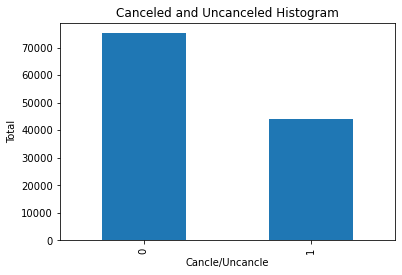

In [168]:
count_cancel = pd.value_counts(data['is_canceled'], sort=True).sort_index()
count_cancel.plot(kind='bar')
plt.title('Canceled and Uncanceled Histogram')
plt.xlabel('Cancle/Uncancle')
plt.ylabel('Total')

### Preprocessing The Data


#### fillna

In [169]:
data2 = data.fillna(data.mean()).copy()

In [170]:
data2.head()

,hotel,is_canceled,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,1,0,342,0,0,2,0.00000,0,4,3,0,0,0,6,3,2,86.69338,189.26674,0,0,0.00000,0,0
1,1,0,737,0,0,2,0.00000,0,4,3,0,0,0,6,4,2,86.69338,189.26674,0,0,0.00000,0,0
2,1,0,7,0,1,1,0.00000,0,4,3,0,0,0,0,0,2,86.69338,189.26674,0,0,75.00000,0,0
3,1,0,13,0,1,1,0.00000,0,3,2,0,0,0,0,0,2,304.00000,189.26674,0,0,75.00000,0,0
4,1,0,14,0,2,2,0.00000,0,7,4,0,0,0,0,0,2,240.00000,189.26674,0,0,98.00000,0,1


##### Standard The Data

In [171]:
from sklearn.preprocessing import StandardScaler

In [172]:
data1 = data2.copy()

In [173]:
data1['normlead_time'] = StandardScaler().fit_transform(data1['lead_time'].values.reshape(-1, 1))
data1['normstays_in_weekend_nights'] = StandardScaler().fit_transform(data1['stays_in_weekend_nights'].values.reshape(-1, 1))
data1['normstays_in_week_nights'] = StandardScaler().fit_transform(data1['stays_in_week_nights'].values.reshape(-1, 1))
data1['normadults'] = StandardScaler().fit_transform(data1['adults'].values.reshape(-1, 1))
data1['normchildren'] = StandardScaler().fit_transform(data1['children'].values.reshape(-1, 1))
data1['normbabies'] = StandardScaler().fit_transform(data1['babies'].values.reshape(-1, 1))
data1['normmarket_segment'] = StandardScaler().fit_transform(data1['market_segment'].values.reshape(-1, 1))
data1['normdistribution_channel'] = StandardScaler().fit_transform(data1['distribution_channel'].values.reshape(-1, 1))
data1['normprevious_cancellations'] = StandardScaler().fit_transform(data1['previous_cancellations'].values.reshape(-1, 1))
data1['normprevious_bookings_not_canceled'] = StandardScaler().fit_transform(data1['previous_bookings_not_canceled'].values.reshape(-1, 1))
data1['normreserved_room_type'] = StandardScaler().fit_transform(data1['reserved_room_type'].values.reshape(-1, 1))
data1['normbooking_changes'] = StandardScaler().fit_transform(data1['booking_changes'].values.reshape(-1, 1))
data1['normdeposit_type'] = StandardScaler().fit_transform(data1['deposit_type'].values.reshape(-1, 1))
data1['normagent'] = StandardScaler().fit_transform(data1['agent'].values.reshape(-1, 1))
data1['normcompany'] = StandardScaler().fit_transform(data1['company'].values.reshape(-1, 1))
data1['normadr'] = StandardScaler().fit_transform(data1['adr'].values.reshape(-1, 1))
data1['normtotal_of_special_requests'] = StandardScaler().fit_transform(data1['total_of_special_requests'].values.reshape(-1, 1))


data1 = data1.drop(['market_segment', 'distribution_channel', 'lead_time', 'stays_in_weekend_nights', 
                    'adults', 'children', 'babies', 'previous_cancellations', 'previous_bookings_not_canceled',
                    'reserved_room_type', 'booking_changes', 'deposit_type', 'agent', 'company', 'adr', 
                    'total_of_special_requests'], axis=1)
data1.head()

,hotel,is_canceled,stays_in_week_nights,is_repeated_guest,days_in_waiting_list,customer_type,required_car_parking_spaces,normlead_time,normstays_in_weekend_nights,normstays_in_week_nights,normadults,normchildren,normbabies,normmarket_segment,normdistribution_channel,normprevious_cancellations,normprevious_bookings_not_canceled,normreserved_room_type,normbooking_changes,normdeposit_type,normagent,normcompany,normadr,normtotal_of_special_requests
0,1,0,0,0,0,0,0,2.22705,-0.92889,-1.31024,0.24790,-0.26067,-0.08158,-1.52177,-1.37877,-0.10318,-0.09155,4.68624,4.26010,0.37318,0.00000,0.00000,-2.01504,-0.72069
1,1,0,0,0,0,0,0,5.92338,-0.92889,-1.31024,0.24790,-0.26067,-0.08158,-1.52177,-1.37877,-0.10318,-0.09155,4.68624,5.79313,0.37318,0.00000,0.00000,-2.01504,-0.72069
2,1,0,1,0,0,0,0,-0.90781,-0.92889,-0.78621,-1.47845,-0.26067,-0.08158,-1.52177,-1.37877,-0.10318,-0.09155,-0.46669,-0.33899,0.37318,0.00000,0.00000,-0.53094,-0.72069
3,1,0,1,0,0,0,0,-0.85167,-0.92889,-0.78621,-1.47845,-0.26067,-0.08158,-2.31108,-3.19183,-0.10318,-0.09155,-0.46669,-0.33899,0.37318,2.11152,0.00000,-0.53094,-0.72069
4,1,0,2,0,0,0,0,-0.84231,-0.92889,-0.26217,0.24790,-0.26067,-0.08158,0.84617,0.43429,-0.10318,-0.09155,-0.46669,-0.33899,0.37318,1.48965,0.00000,-0.07581,0.54067


#### Set Label and Feature

In [174]:
X = data1.iloc[:, data1.columns != 'is_canceled']
Y = data1.iloc[:, data1.columns == 'is_canceled']

##  UnderSample

In [175]:
# Because we are using UnderSample 
# So first we need to know How many sample are we cancled data
number_records_cancel = len(data1[data.is_canceled == 1])
number_records_cancel

44224

In [176]:
# Get the actually index
cancel_indices = np.array(data1[data1.is_canceled == 1].index)
cancel_indices

array([     8,      9,     10, ..., 111924, 111925, 117295])

In [177]:
# We need to get the index from the data that is not canceled for next step which is random chose
uncancel_indices = data1[data1.is_canceled == 0].index
uncancel_indices

Int64Index([     0,      1,      2,      3,      4,      5,      6,      7,
                11,     12,
            ...
            119380, 119381, 119382, 119383, 119384, 119385, 119386, 119387,
            119388, 119389],
           dtype='int64', length=75166)

In [178]:
# In the uncancel_indices, We randomly choose the same number as number_records_cancel 
random_uncancel_indices = np.random.choice(uncancel_indices, number_records_cancel, replace=False)
# convert type 
random_uncancel_indices = np.array(random_uncancel_indices)
random_uncancel_indices

array([ 88890,  35202, 113281, ...,  46516,  23029, 113230])

In [179]:
# Append the 2 indices 
under_sample_indices = np.concatenate([cancel_indices, random_uncancel_indices])
under_sample_indices

array([     8,      9,     10, ...,  46516,  23029, 113230])

In [180]:
# Using iloc to locate our undersample dataset
under_sample_data = data1.iloc[under_sample_indices].copy()
under_sample_data.head()

,hotel,is_canceled,stays_in_week_nights,is_repeated_guest,days_in_waiting_list,customer_type,required_car_parking_spaces,normlead_time,normstays_in_weekend_nights,normstays_in_week_nights,normadults,normchildren,normbabies,normmarket_segment,normdistribution_channel,normprevious_cancellations,normprevious_bookings_not_canceled,normreserved_room_type,normbooking_changes,normdeposit_type,normagent,normcompany,normadr,normtotal_of_special_requests
8,1,1,3,0,0,0,0,-0.17791,-0.92889,0.26186,0.24790,-0.26067,-0.08158,0.84617,0.43429,-0.10318,-0.09155,-0.46669,-0.33899,0.37318,1.48965,0.00000,-0.39242,0.54067
9,1,1,3,0,0,0,0,-0.27148,-0.92889,0.26186,0.24790,-0.26067,-0.08158,0.05686,0.43429,-0.10318,-0.09155,0.39213,-0.33899,0.37318,-0.69663,0.00000,0.07260,-0.72069
10,1,1,4,0,0,0,0,-0.75809,-0.92889,0.78589,0.24790,-0.26067,-0.08158,0.84617,0.43429,-0.10318,-0.09155,1.25096,-0.33899,0.37318,1.48965,0.00000,0.41889,-0.72069
27,1,1,5,0,0,0,0,-0.41185,1.07389,1.30992,0.24790,-0.26067,-0.08158,0.84617,0.43429,-0.10318,-0.09155,1.25096,-0.33899,0.37318,1.48965,0.00000,0.10228,1.80203
32,1,1,8,0,0,0,0,-0.07497,1.07389,2.88202,0.24790,-0.26067,-0.08158,-1.52177,-1.37877,-0.10318,-0.09155,1.25096,-0.33899,0.37318,0.00000,0.00000,0.12801,1.80203


#### Undersample feature and label

In [181]:
X_undersample = under_sample_data.iloc[:, under_sample_data.columns != 'is_canceled']
Y_undersample = under_sample_data.iloc[:, under_sample_data.columns == 'is_canceled']

In [182]:
# Show the ratio
print('Percentage of cancel', len(under_sample_data[under_sample_data.is_canceled == 1])/len(under_sample_data))
print('Percentage of uncancel', len(under_sample_data[under_sample_data.is_canceled == 0])/len(under_sample_data))
print('Total number of under_sample_data', len(under_sample_data))
print('GOOD JOB')

Percentage of cancel 0.5
Percentage of uncancel 0.5
Total number of under_sample_data 88448
GOOD JOB


### Cross-Validation

In [183]:
from sklearn.model_selection import train_test_split

**Whole dataset**

In [184]:
# we set test data set to 0.3
# Split the dataset
# Random_state in sure that our train dataset and test dataset split in a random way
# And Random_state = 0 means that every time we split the dataset we will get the same random res
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0) 
print('Number train dataset', len(X_train))
print('Number test dataset', len(X_test))
print('Total', len(X_train)+len(X_test))

Number train dataset 83573
Number test dataset 35817
Total 119390


**Undersample dataset**

In [185]:
X_train_undersample, X_test_undersample, y_train_undersample, y_test_undersample = train_test_split(X_undersample, 
                                                                                                    Y_undersample, 
                                                                                                    test_size=0.3,
                                                                                                    random_state=0)

print('Number train dataset', len(X_train_undersample))
print('Number test dataset', len(X_test_undersample))
print('Total', len(X_train_undersample)+len(X_test_undersample))

Number train dataset 61913
Number test dataset 26535
Total 88448


## Build the model Using Logistic Regression


**Model evaluation criteria**

We don't use `Precision`, instead we use `recall` 

`Recall = TP/(TP + FN)`

- `TP` = true positives 正利判断成正利
- `FN` = false negative 正利判断为负利


In [186]:
# LogisticRegression
from sklearn.linear_model import LogisticRegression

In [187]:
# KFold allow us to make n times cross validation as we want 
from sklearn.model_selection import KFold, cross_val_score

In [188]:
from sklearn.metrics import confusion_matrix,recall_score,classification_report

In [189]:
def printing_Kfold_scores(x_train_data,y_train_data):
    fold = KFold(n_splits=5,shuffle=False) 

    # Different C parameters
    c_param_range = [0.01,0.1,1,10,100]

    results_table = pd.DataFrame(index = range(len(c_param_range),2), columns = ['C_parameter','Mean recall score'])
    results_table['C_parameter'] = c_param_range

    
    j = 0
    for c_param in c_param_range:
        print('-------------------------------------------')
        print('C parameter: ', c_param)
        print('-------------------------------------------')
        print('')

        recall_accs = []
        for train_index, test_index in fold.split(x_train_data, y_train_data):


            
            lr = LogisticRegression(C = c_param, penalty = 'l1', solver='liblinear', max_iter=100000)

            
            lr.fit(x_train_data.iloc[train_index,:],y_train_data.iloc[train_index,:].values.ravel())

            # Predict values using the test indices in the training data
            y_pred_undersample = lr.predict(x_train_data.iloc[train_index,:].values)

            # Calculate the recall score and append it to a list for recall scores representing the current c_parameter
            recall_acc = recall_score(y_train_data.iloc[train_index,:].values,y_pred_undersample)
            recall_accs.append(recall_acc)
            print(' recall score = ', recall_acc)

        # The mean value of those recall scores is the metric we want to save and get hold of.
        results_table.iloc[j,results_table.columns.get_loc('Mean recall score')] = np.mean(recall_accs)
        j += 1
        print('')
        print('Mean recall score ', np.mean(recall_accs))
        print('')

    best_c = results_table.loc[results_table['Mean recall score'].astype(float).idxmax()]['C_parameter']
    
    # Finally, we can check which C parameter is the best amongst the chosen.
    print('*********************************************************************************')
    print('Best model to choose from cross validation is with C parameter = ', best_c)
    print('*********************************************************************************')
    
    return best_c

In [190]:
best_c = printing_Kfold_scores(X_train_undersample, y_train_undersample)

-------------------------------------------
C parameter:  0.01
-------------------------------------------

 recall score =  0.702965132608434
 recall score =  0.702560788432022
 recall score =  0.7037319422150883
 recall score =  0.7002575660012879
 recall score =  0.7029093396643998

Mean recall score  0.7024849537842462

-------------------------------------------
C parameter:  0.1
-------------------------------------------

 recall score =  0.7118725675079244
 recall score =  0.7117699329509654
 recall score =  0.7130818619582665
 recall score =  0.7102784932388925
 recall score =  0.7115609029817713

Mean recall score  0.7117127517275641

-------------------------------------------
C parameter:  1
-------------------------------------------

 recall score =  0.7124342976367211
 recall score =  0.7126585346150739
 recall score =  0.7151284109149277
 recall score =  0.7109224082421121
 recall score =  0.7133314554746288

Mean recall score  0.7128950213766927

----------------------

**The recall is nearly 0.7, And We will use `c = 10.0` after**

##### Confusion_matrix

In [191]:
from sklearn.metrics import confusion_matrix,recall_score,classification_report

In [192]:
def plot_confusion_matrix(cm, classes, title='Confusion Matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [193]:
import itertools

In [194]:
lr = LogisticRegression(C = best_c, penalty = 'l1', solver='liblinear')
lr.fit(X_train_undersample,y_train_undersample.values.ravel())
y_pred_undersample = lr.predict(X_test_undersample.values)

#### The Confusion matrix for the undersample dataset

Recall metric in the testing dataset:  0.7134382842801734


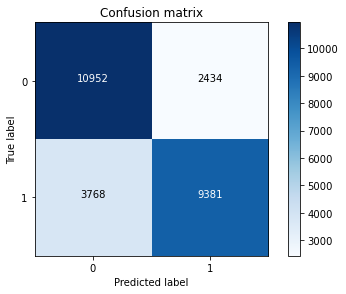

In [195]:
cnf_matrix = confusion_matrix(y_test_undersample,y_pred_undersample)
np.set_printoptions(precision=2)
print("Recall metric in the testing dataset: ", cnf_matrix[1,1]/(cnf_matrix[1,0]+cnf_matrix[1,1]))
# Plot non-normalized confusion matrix
class_names = [0,1]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

Recall metric in the testing dataset:  0.5556299271158709


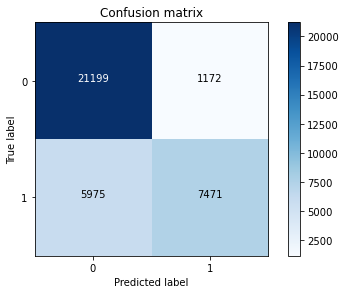

In [196]:
lr = LogisticRegression(C = best_c, penalty = 'l1', solver='liblinear')
lr.fit(X_train,y_train.values.ravel())
y_pred = lr.predict(X_test.values)

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test,y_pred)
np.set_printoptions(precision=2)

print("Recall metric in the testing dataset: ", cnf_matrix[1,1]/(cnf_matrix[1,0]+cnf_matrix[1,1]))

# Plot non-normalized confusion matrix
class_names = [0,1]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()

The 1172 is not good, the 1172 is not cancaled

for whole dataset

In [197]:
best_c = printing_Kfold_scores(X_train, y_train)

-------------------------------------------
C parameter:  0.01
-------------------------------------------

 recall score =  0.5406039996761396
 recall score =  0.5418903530177323
 recall score =  0.5405668410169079
 recall score =  0.5389258186860242
 recall score =  0.5399383066807371

Mean recall score  0.5403850638155082

-------------------------------------------
C parameter:  0.1
-------------------------------------------

 recall score =  0.5506841551291394
 recall score =  0.5510004880429478
 recall score =  0.5510684020597656
 recall score =  0.5480200644345663
 recall score =  0.5502069973212111

Mean recall score  0.550196021397526

-------------------------------------------
C parameter:  1
-------------------------------------------

 recall score =  0.5518986316897417
 recall score =  0.5515698714820237
 recall score =  0.5520415196853586
 recall score =  0.5491619428245178
 recall score =  0.5514246286224531

Mean recall score  0.551219318860819

----------------------

bad

#### Make the Threshold different maybe can improve our model

- Using predict_proba to predict the probability

- set thresholds = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

Recall metric in the testing dataset:  0.9944482470149821
Recall metric in the testing dataset:  0.9660810708038634
Recall metric in the testing dataset:  0.89968818921591
Recall metric in the testing dataset:  0.8146627119933075
Recall metric in the testing dataset:  0.7134382842801734
Recall metric in the testing dataset:  0.5788272872461784
Recall metric in the testing dataset:  0.45516769336071183
Recall metric in the testing dataset:  0.3874058863791923
Recall metric in the testing dataset:  0.3611681496691764


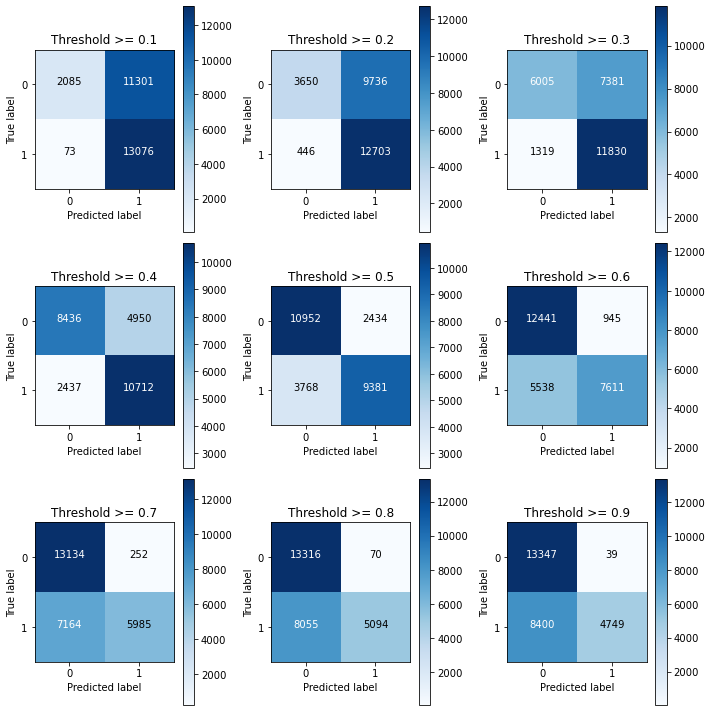

In [198]:
lr = LogisticRegression(C=10.0, penalty = 'l1', solver='liblinear')
lr.fit(X_train_undersample, y_train_undersample.values.ravel())
y_pred_undersample_proba = lr.predict_proba(X_test_undersample.values)

thresholds = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

plt.figure(figsize=(10,10))

j=1
for i in thresholds:
    y_test_predictions_high_recall = y_pred_undersample_proba[:,1] > i
    
    plt.subplot(3,3,j)
    j += 1
    
    # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test_undersample,y_test_predictions_high_recall)
    np.set_printoptions(precision=2)
    
    print("Recall metric in the testing dataset: ", cnf_matrix[1,1]/(cnf_matrix[1,0]+cnf_matrix[1,1]))
    
    class_names = [0,1]
    plot_confusion_matrix(cnf_matrix, classes=class_names, title='Threshold >= %s'%i)

**With the increasing of `Threshold`, The `precision` is increasing, The `Recall` is decreasing**

## OverSample

**Create the cancled data**

- Using SMOTE

In [199]:
import sys
!{sys.executable} -m pip install imblearn

**Normalize the training data**

In [200]:
data1['nnormlead_time'] = StandardScaler().fit_transform(data1['normlead_time'].values.reshape(-1, 1))
data1['nnormstays_in_weekend_nights'] = StandardScaler().fit_transform(data1['normstays_in_weekend_nights'].values.reshape(-1, 1))
data1['nnormstays_in_week_nights'] = StandardScaler().fit_transform(data1['normstays_in_week_nights'].values.reshape(-1, 1))
data1['nnormadults'] = StandardScaler().fit_transform(data1['normadults'].values.reshape(-1, 1))
data1['nnormchildren'] = StandardScaler().fit_transform(data1['normchildren'].values.reshape(-1, 1))
data1['nnormbabies'] = StandardScaler().fit_transform(data1['normbabies'].values.reshape(-1, 1))
data1['nnormmarket_segment'] = StandardScaler().fit_transform(data1['normmarket_segment'].values.reshape(-1, 1))
data1['nnormdistribution_channel'] = StandardScaler().fit_transform(data1['normdistribution_channel'].values.reshape(-1, 1))
data1['nnormprevious_cancellations'] = StandardScaler().fit_transform(data1['normprevious_cancellations'].values.reshape(-1, 1))
data1['nnormprevious_bookings_not_canceled'] = StandardScaler().fit_transform(data1['normprevious_bookings_not_canceled'].values.reshape(-1, 1))
data1['nnormreserved_room_type'] = StandardScaler().fit_transform(data1['normreserved_room_type'].values.reshape(-1, 1))
data1['nnormbooking_changes'] = StandardScaler().fit_transform(data1['normbooking_changes'].values.reshape(-1, 1))
data1['nnormdeposit_type'] = StandardScaler().fit_transform(data1['normdeposit_type'].values.reshape(-1, 1))
data1['nnormagent'] = StandardScaler().fit_transform(data1['normagent'].values.reshape(-1, 1))
data1['nnormcompany'] = StandardScaler().fit_transform(data1['normcompany'].values.reshape(-1, 1))
data1['nnormadr'] = StandardScaler().fit_transform(data1['normadr'].values.reshape(-1, 1))
data1['nnormtotal_of_special_requests'] = StandardScaler().fit_transform(data1['normtotal_of_special_requests'].values.reshape(-1, 1))


data1 = data1.drop(['normmarket_segment', 'normdistribution_channel', 'normlead_time', 'normstays_in_weekend_nights', 
                    'normadults', 'normchildren', 'normbabies', 'normprevious_cancellations', 'normprevious_bookings_not_canceled',
                    'normreserved_room_type', 'normbooking_changes', 'normdeposit_type', 'normagent', 'normcompany', 'normadr', 
                    'normtotal_of_special_requests'], axis=1)
data1.head()

,hotel,is_canceled,stays_in_week_nights,is_repeated_guest,days_in_waiting_list,customer_type,required_car_parking_spaces,normstays_in_week_nights,nnormlead_time,nnormstays_in_weekend_nights,nnormstays_in_week_nights,nnormadults,nnormchildren,nnormbabies,nnormmarket_segment,nnormdistribution_channel,nnormprevious_cancellations,nnormprevious_bookings_not_canceled,nnormreserved_room_type,nnormbooking_changes,nnormdeposit_type,nnormagent,nnormcompany,nnormadr,nnormtotal_of_special_requests
0,1,0,0,0,0,0,0,-1.31024,2.22705,-0.92889,-1.31024,0.24790,-0.26067,-0.08158,-1.52177,-1.37877,-0.10318,-0.09155,4.68624,4.26010,0.37318,-0.00000,-0.00000,-2.01504,-0.72069
1,1,0,0,0,0,0,0,-1.31024,5.92338,-0.92889,-1.31024,0.24790,-0.26067,-0.08158,-1.52177,-1.37877,-0.10318,-0.09155,4.68624,5.79313,0.37318,-0.00000,-0.00000,-2.01504,-0.72069
2,1,0,1,0,0,0,0,-0.78621,-0.90781,-0.92889,-0.78621,-1.47845,-0.26067,-0.08158,-1.52177,-1.37877,-0.10318,-0.09155,-0.46669,-0.33899,0.37318,-0.00000,-0.00000,-0.53094,-0.72069
3,1,0,1,0,0,0,0,-0.78621,-0.85167,-0.92889,-0.78621,-1.47845,-0.26067,-0.08158,-2.31108,-3.19183,-0.10318,-0.09155,-0.46669,-0.33899,0.37318,2.11152,-0.00000,-0.53094,-0.72069
4,1,0,2,0,0,0,0,-0.26217,-0.84231,-0.92889,-0.26217,0.24790,-0.26067,-0.08158,0.84617,0.43429,-0.10318,-0.09155,-0.46669,-0.33899,0.37318,1.48965,-0.00000,-0.07581,0.54067


In [201]:
data1['nnnormlead_time'] = StandardScaler().fit_transform(data1['nnormlead_time'].values.reshape(-1, 1))
data1['nnnormreserved_room_type'] = StandardScaler().fit_transform(data1['nnormreserved_room_type'].values.reshape(-1, 1))
data1['nnnormbooking_changes'] = StandardScaler().fit_transform(data1['nnormbooking_changes'].values.reshape(-1, 1))

data1.drop(['nnormlead_time', 'nnormreserved_room_type', 'nnormbooking_changes'], axis=1, inplace=True)
data1.head()

,hotel,is_canceled,stays_in_week_nights,is_repeated_guest,days_in_waiting_list,customer_type,required_car_parking_spaces,normstays_in_week_nights,nnormstays_in_weekend_nights,nnormstays_in_week_nights,nnormadults,nnormchildren,nnormbabies,nnormmarket_segment,nnormdistribution_channel,nnormprevious_cancellations,nnormprevious_bookings_not_canceled,nnormdeposit_type,nnormagent,nnormcompany,nnormadr,nnormtotal_of_special_requests,nnnormlead_time,nnnormreserved_room_type,nnnormbooking_changes
0,1,0,0,0,0,0,0,-1.31024,-0.92889,-1.31024,0.24790,-0.26067,-0.08158,-1.52177,-1.37877,-0.10318,-0.09155,0.37318,-0.00000,-0.00000,-2.01504,-0.72069,2.22705,4.68624,4.26010
1,1,0,0,0,0,0,0,-1.31024,-0.92889,-1.31024,0.24790,-0.26067,-0.08158,-1.52177,-1.37877,-0.10318,-0.09155,0.37318,-0.00000,-0.00000,-2.01504,-0.72069,5.92338,4.68624,5.79313
2,1,0,1,0,0,0,0,-0.78621,-0.92889,-0.78621,-1.47845,-0.26067,-0.08158,-1.52177,-1.37877,-0.10318,-0.09155,0.37318,-0.00000,-0.00000,-0.53094,-0.72069,-0.90781,-0.46669,-0.33899
3,1,0,1,0,0,0,0,-0.78621,-0.92889,-0.78621,-1.47845,-0.26067,-0.08158,-2.31108,-3.19183,-0.10318,-0.09155,0.37318,2.11152,-0.00000,-0.53094,-0.72069,-0.85167,-0.46669,-0.33899
4,1,0,2,0,0,0,0,-0.26217,-0.92889,-0.26217,0.24790,-0.26067,-0.08158,0.84617,0.43429,-0.10318,-0.09155,0.37318,1.48965,-0.00000,-0.07581,0.54067,-0.84231,-0.46669,-0.33899


In [202]:
data1['nnnormmarket_segment'] = StandardScaler().fit_transform(data1['nnormmarket_segment'].values.reshape(-1, 1))
data1['nnnormdistribution_channel'] = StandardScaler().fit_transform(data1['nnormdistribution_channel'].values.reshape(-1, 1))
data1['nnnormagent'] = StandardScaler().fit_transform(data1['nnormagent'].values.reshape(-1, 1))
data1['nnnormadr'] = StandardScaler().fit_transform(data1['nnormadr'].values.reshape(-1, 1))
data1['nnnnormlead_time'] = StandardScaler().fit_transform(data1['nnnormlead_time'].values.reshape(-1, 1))
data1['nnnnormreserved_room_type'] = StandardScaler().fit_transform(data1['nnnormreserved_room_type'].values.reshape(-1, 1))
data1['nnnnormbooking_changes'] = StandardScaler().fit_transform(data1['nnnormbooking_changes'].values.reshape(-1, 1))

data1.drop(['nnormmarket_segment', 'nnormdistribution_channel', 'nnormagent', 'nnormadr', 'nnnormlead_time', 'nnnormreserved_room_type', 'nnnormbooking_changes'], axis=1, inplace=True)
data1.head()

,hotel,is_canceled,stays_in_week_nights,is_repeated_guest,days_in_waiting_list,customer_type,required_car_parking_spaces,normstays_in_week_nights,nnormstays_in_weekend_nights,nnormstays_in_week_nights,nnormadults,nnormchildren,nnormbabies,nnormprevious_cancellations,nnormprevious_bookings_not_canceled,nnormdeposit_type,nnormcompany,nnormtotal_of_special_requests,nnnormmarket_segment,nnnormdistribution_channel,nnnormagent,nnnormadr,nnnnormlead_time,nnnnormreserved_room_type,nnnnormbooking_changes
0,1,0,0,0,0,0,0,-1.31024,-0.92889,-1.31024,0.24790,-0.26067,-0.08158,-0.10318,-0.09155,0.37318,-0.00000,-0.72069,-1.52177,-1.37877,0.00000,-2.01504,2.22705,4.68624,4.26010
1,1,0,0,0,0,0,0,-1.31024,-0.92889,-1.31024,0.24790,-0.26067,-0.08158,-0.10318,-0.09155,0.37318,-0.00000,-0.72069,-1.52177,-1.37877,0.00000,-2.01504,5.92338,4.68624,5.79313
2,1,0,1,0,0,0,0,-0.78621,-0.92889,-0.78621,-1.47845,-0.26067,-0.08158,-0.10318,-0.09155,0.37318,-0.00000,-0.72069,-1.52177,-1.37877,0.00000,-0.53094,-0.90781,-0.46669,-0.33899
3,1,0,1,0,0,0,0,-0.78621,-0.92889,-0.78621,-1.47845,-0.26067,-0.08158,-0.10318,-0.09155,0.37318,-0.00000,-0.72069,-2.31108,-3.19183,2.11152,-0.53094,-0.85167,-0.46669,-0.33899
4,1,0,2,0,0,0,0,-0.26217,-0.92889,-0.26217,0.24790,-0.26067,-0.08158,-0.10318,-0.09155,0.37318,-0.00000,0.54067,0.84617,0.43429,1.48965,-0.07581,-0.84231,-0.46669,-0.33899


In [203]:
data1['lead_time'] = StandardScaler().fit_transform(data1['nnnnormlead_time'].values.reshape(-1, 1))
data1['stays_in_weekend_nights'] = StandardScaler().fit_transform(data1['nnormstays_in_weekend_nights'].values.reshape(-1, 1))
data1['stays_in_week_nights'] = StandardScaler().fit_transform(data1['nnormstays_in_week_nights'].values.reshape(-1, 1))
data1['adults'] = StandardScaler().fit_transform(data1['nnormadults'].values.reshape(-1, 1))
data1['children'] = StandardScaler().fit_transform(data1['nnormchildren'].values.reshape(-1, 1))
data1['babies'] = StandardScaler().fit_transform(data1['nnormbabies'].values.reshape(-1, 1))
data1['market_segment'] = StandardScaler().fit_transform(data1['nnnormmarket_segment'].values.reshape(-1, 1))
data1['distribution_channel'] = StandardScaler().fit_transform(data1['nnnormdistribution_channel'].values.reshape(-1, 1))
data1['previous_cancellations'] = StandardScaler().fit_transform(data1['nnormprevious_cancellations'].values.reshape(-1, 1))
data1['previous_bookings_not_canceled'] = StandardScaler().fit_transform(data1['nnormprevious_bookings_not_canceled'].values.reshape(-1, 1))
data1['reserved_room_type'] = StandardScaler().fit_transform(data1['nnnnormreserved_room_type'].values.reshape(-1, 1))
data1['booking_changes'] = StandardScaler().fit_transform(data1['nnnnormbooking_changes'].values.reshape(-1, 1))
data1['deposit_type'] = StandardScaler().fit_transform(data1['nnormdeposit_type'].values.reshape(-1, 1))
data1['agent'] = StandardScaler().fit_transform(data1['nnnormagent'].values.reshape(-1, 1))
data1['company'] = StandardScaler().fit_transform(data1['nnormcompany'].values.reshape(-1, 1))
data1['adr'] = StandardScaler().fit_transform(data1['nnnormadr'].values.reshape(-1, 1))
data1['total_of_special_requests'] = StandardScaler().fit_transform(data1['nnormtotal_of_special_requests'].values.reshape(-1, 1))


data1 = data1.drop(['nnnnormlead_time', 'nnormstays_in_weekend_nights', 'nnormstays_in_week_nights', 'nnormadults', 
                    'nnormchildren', 'nnormbabies', 'nnnormmarket_segment', 'nnnormdistribution_channel', 'nnormprevious_cancellations',
                    'nnormprevious_bookings_not_canceled', 'nnnnormreserved_room_type', 'nnnnormbooking_changes', 'nnormdeposit_type', 'nnnormagent', 'nnormcompany', 
                    'nnnormadr','nnormtotal_of_special_requests'], axis=1)
data1.head()

,hotel,is_canceled,stays_in_week_nights,is_repeated_guest,days_in_waiting_list,customer_type,required_car_parking_spaces,normstays_in_week_nights,lead_time,stays_in_weekend_nights,adults,children,babies,market_segment,distribution_channel,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,deposit_type,agent,company,adr,total_of_special_requests
0,1,0,-1.31024,0,0,0,0,-1.31024,2.22705,-0.92889,0.24790,-0.26067,-0.08158,-1.52177,-1.37877,-0.10318,-0.09155,4.68624,4.26010,0.37318,0.00000,-0.00000,-2.01504,-0.72069
1,1,0,-1.31024,0,0,0,0,-1.31024,5.92338,-0.92889,0.24790,-0.26067,-0.08158,-1.52177,-1.37877,-0.10318,-0.09155,4.68624,5.79313,0.37318,0.00000,-0.00000,-2.01504,-0.72069
2,1,0,-0.78621,0,0,0,0,-0.78621,-0.90781,-0.92889,-1.47845,-0.26067,-0.08158,-1.52177,-1.37877,-0.10318,-0.09155,-0.46669,-0.33899,0.37318,0.00000,-0.00000,-0.53094,-0.72069
3,1,0,-0.78621,0,0,0,0,-0.78621,-0.85167,-0.92889,-1.47845,-0.26067,-0.08158,-2.31108,-3.19183,-0.10318,-0.09155,-0.46669,-0.33899,0.37318,2.11152,-0.00000,-0.53094,-0.72069
4,1,0,-0.26217,0,0,0,0,-0.26217,-0.84231,-0.92889,0.24790,-0.26067,-0.08158,0.84617,0.43429,-0.10318,-0.09155,-0.46669,-0.33899,0.37318,1.48965,-0.00000,-0.07581,0.54067


**Using SMOTE**

In [204]:
from imblearn.over_sampling import SMOTE

In [205]:
features_train, features_test, labels_train, labels_test = train_test_split(X, Y, test_size=0.2, random_state=0)

In [206]:
oversampler=SMOTE(random_state=0)
os_features,os_labels=oversampler.fit_sample(features_train,labels_train)

In [207]:
len(os_labels[os_labels==1])

120464

# DO NOT RUN THIS CELL, IT WILL TAKE A LONG TIME

In [208]:
os_features = pd.DataFrame(os_features)
os_labels = pd.DataFrame(os_labels)
best_c = printing_Kfold_scores(os_features,os_labels)

-------------------------------------------
C parameter:  0.01
-------------------------------------------

 recall score =  0.7407371332839833
 recall score =  0.7385721522933635
 recall score =  0.7388891052857087
 recall score =  0.7340802583389123
 recall score =  0.5543165467625899

Mean recall score  0.7013190391929116

-------------------------------------------
C parameter:  0.1
-------------------------------------------

 recall score =  0.7514317995870183
 recall score =  0.749074470987101
 recall score =  0.749892883574183
 recall score =  0.745717323671878
 recall score =  0.5610127282789154

Mean recall score  0.7114258412198191

-------------------------------------------
C parameter:  1
-------------------------------------------

 recall score =  0.7515486811859586
 recall score =  0.7495810763415299
 recall score =  0.7501265921396019
 recall score =  0.7455794904107431
 recall score =  0.5618151632540122

Mean recall score  0.7117302006663693

-----------------------

In [213]:
#ALSO DONT RUN THIS ONE 

Recall metric in the testing dataset:  0.7018112701252236


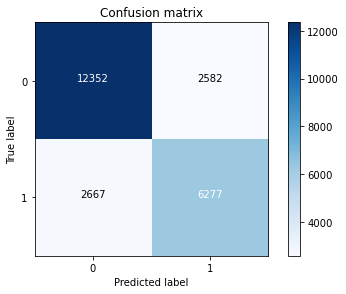

In [212]:
lr = LogisticRegression(C = best_c, penalty = 'l1',solver='liblinear',max_iter=100000)
lr.fit(os_features,os_labels.values.ravel())
y_pred = lr.predict(features_test.values)

# Compute confusion matrix
cnf_matrix = confusion_matrix(labels_test,y_pred)
np.set_printoptions(precision=2)

print("Recall metric in the testing dataset: ", cnf_matrix[1,1]/(cnf_matrix[1,0]+cnf_matrix[1,1]))

# Plot non-normalized confusion matrix
class_names = [0,1]
plt.figure()
plot_confusion_matrix(cnf_matrix
                      , classes=class_names
                      , title='Confusion matrix')
plt.show()